In [1]:
#Basic libraries
import pandas as pd 
import numpy as np 

#ML libraries
from sklearn.linear_model import Ridge, Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error

#Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [2]:
## Suppress warnings
import warnings
warnings.filterwarnings("ignore")

## Data Import

In [3]:
## Load the csv file
df = pd.read_csv('train.csv')

In [4]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
#Dimensions
df.shape

(1460, 81)

### Data Analysis

In [6]:
## Dataframe information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

There are no NULL values present in the data as seen from the information above. 
I will conform this with isull just to be sure.

In [7]:
print("There are "+str(df.isnull().sum().sum())+" NULL's in the dataframe")

There are 6965 NULL's in the dataframe


In [8]:
#percentage of null values (non zero) in differend columns
col_list = list(df)
null_v = []
for i in df.isnull().sum()*100/df.shape[0]:
    null_v.append(i)
data = {'columns': col_list, 'Nulls%': null_v}
df_null = pd.DataFrame(data)
df_null[df_null['Nulls%'] != 0].sort_values('Nulls%', ascending=False)

,columns,Nulls%
72,PoolQC,99.520548
74,MiscFeature,96.301370
6,Alley,93.767123
73,Fence,80.753425
57,FireplaceQu,47.260274
3,LotFrontage,17.739726
58,GarageType,5.547945
59,GarageYrBlt,5.547945
60,GarageFinish,5.547945
63,GarageQual,5.547945


The features PoolQC,MiscFeature,Alley,Fence have hign proportion of NULL values. Even if we create a separate category as "NA" for these features it will create a highly skewed distribution. 

Hence we can remove these features from the dataset.

In [9]:
df.drop(['PoolQC','MiscFeature','Alley','Fence'], axis=1, inplace=True)

In [10]:
# Analyse FireplaceQu nulls
df['FireplaceQu'].value_counts(dropna=False)

NaN    690
Gd     380
TA     313
Fa      33
Ex      24
Po      20
Name: FireplaceQu, dtype: int64

In [11]:
df['Fireplaces'].value_counts()

0    690
1    650
2    115
3      5
Name: Fireplaces, dtype: int64

With above value counts, it is evident that the "NULLS" in FireplaceQu is when there is no Fireplace at the house.
Hence we can create a new category for NULL in FireplaceQu as "No Fireplace"

In [12]:
df['FireplaceQu'].fillna("No Fireplace", inplace=True)

In [13]:
#Analyzing GarageType,GarageYrBlt,GarageFinish,GarageQual,GarageCond
df['GarageType'].value_counts(dropna=False)

Attchd     870
Detchd     387
BuiltIn     88
NaN         81
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64

In [14]:
df['GarageCars'].value_counts(dropna=False)

2    824
1    369
3    181
0     81
4      5
Name: GarageCars, dtype: int64

With above value counts, it is evident that the "NULLS" in GarageType,GarageYrBlt,GarageFinish,GarageQual,GarageCond is when there is no Garage at the house. Hence we can create a new category for NULL with "No Garage".

Note: All the fields related to Garage have same percentage of NULLS i.e. 5.547945 hence we can analyze only one field and extrapolate the knowledge to rest of the fields.

In [15]:
df['GarageType'].fillna("No Garage", inplace=True)
df['GarageYrBlt'].fillna("No Garage", inplace=True)
df['GarageFinish'].fillna("No Garage", inplace=True)
df['GarageQual'].fillna("No Garage", inplace=True)
df['GarageCond'].fillna("No Garage", inplace=True)

In [16]:
#Analyzing BsmtExposure, BsmtFinType2
df['BsmtExposure'].value_counts(dropna=False)

No     953
Av     221
Gd     134
Mn     114
NaN     38
Name: BsmtExposure, dtype: int64

In [17]:
#Analyzing BsmtFinType1, BsmtCond, BsmtQual
df['BsmtFinType1'].value_counts(dropna=False)

Unf    430
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
NaN     37
Name: BsmtFinType1, dtype: int64

Going with previous assumptions, we can replace NULLs in Basement related fields with "No Basement"

In [18]:
df['BsmtExposure'].fillna("No Basement", inplace=True)
df['BsmtFinType2'].fillna("No Basement", inplace=True)
df['BsmtFinType1'].fillna("No Basement", inplace=True)
df['BsmtCond'].fillna("No Basement", inplace=True)
df['BsmtQual'].fillna("No Basement", inplace=True)

In [19]:
#percentage of null values (non zero) in differend columns
col_list = list(df)
null_v = []
for i in df.isnull().sum()*100/df.shape[0]:
    null_v.append(i)
data = {'columns': col_list, 'Nulls%': null_v}
df_null = pd.DataFrame(data)
df_null[df_null['Nulls%'] != 0].sort_values('Nulls%', ascending=False)

,columns,Nulls%
3,LotFrontage,17.739726
24,MasVnrType,0.547945
25,MasVnrArea,0.547945
41,Electrical,0.068493


In [20]:
df['LotFrontage'].describe()

count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64

The mean and median of "LotFrontage" is very close which means there are no major skewness. Hence we can replace NULLS with Median.

In [21]:
df['LotFrontage'].fillna(df['LotFrontage'].median(), inplace=True)

Remaing NULL values are very less hence we can drop them.

In [22]:
df = df.dropna()

In [23]:
print("There are "+str(df.isnull().sum().sum())+" NULL's in the dataframe")

There are 0 NULL's in the dataframe


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1451 entries, 0 to 1459
Data columns (total 77 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1451 non-null   int64  
 1   MSSubClass     1451 non-null   int64  
 2   MSZoning       1451 non-null   object 
 3   LotFrontage    1451 non-null   float64
 4   LotArea        1451 non-null   int64  
 5   Street         1451 non-null   object 
 6   LotShape       1451 non-null   object 
 7   LandContour    1451 non-null   object 
 8   Utilities      1451 non-null   object 
 9   LotConfig      1451 non-null   object 
 10  LandSlope      1451 non-null   object 
 11  Neighborhood   1451 non-null   object 
 12  Condition1     1451 non-null   object 
 13  Condition2     1451 non-null   object 
 14  BldgType       1451 non-null   object 
 15  HouseStyle     1451 non-null   object 
 16  OverallQual    1451 non-null   int64  
 17  OverallCond    1451 non-null   int64  
 18  YearBuil

##### Datatype checks

As per the datatype provided in the data dictionary, few columns like
- MSSubClass
- YearBuilt
- YearRemodAdd
- MoSold
- YrSold

are actually a categorical values but are read as integers.

In [25]:
#Converting fields from integer to categorical
df['MSSubClass']=df['MSSubClass'].astype(object)
df['YearBuilt']=df['YearBuilt'].astype(object)
df['YearRemodAdd']=df['YearRemodAdd'].astype(object)
df['MoSold']=df['MoSold'].astype(object)
df['YrSold']=df['YrSold'].astype(object)

Fields like
   - OverallQual 
   - OverallCond

are also read as Int64, however as per the data distionary these are Ordinal Categorical fields having values as 10 for Very Excellent and 1 for Very Poor. 

We can keep them as is.

In [26]:
## Set display limits
pd.set_option('display.max_columns', None)

In [27]:
## Describe statistical information about the dataset
df.describe()

,Id,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice
count,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.00000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000
mean,729.374225,69.845624,10507.808408,6.093728,5.579600,103.75672,442.274983,46.838043,567.197105,1056.310131,1161.551344,346.742247,5.880772,1514.174363,0.423846,0.057891,1.562371,0.381116,2.866988,1.046175,6.516885,0.612681,1.764990,472.525155,94.412819,46.422467,21.952447,3.430737,15.154376,2.776017,43.758787,180624.101999
std,421.737858,22.044429,9992.987081,1.381467,1.113415,181.10815,455.369276,161.777324,442.209192,437.914609,385.002532,436.453277,48.771560,525.799521,0.518842,0.239449,0.550301,0.502574,0.815086,0.219571,1.626576,0.643443,0.748728,214.171752,125.436852,66.060150,61.108223,29.406940,55.917522,40.301212,497.648467,79312.128273
min,1.000000,21.000000,1300.000000,1.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,34900.000000
25%,364.500000,60.000000,7537.500000,5.000000,5.000000,0.00000,0.000000,0.000000,222.000000,795.000000,882.000000,0.000000,0.000000,1128.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1.000000,327.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,129900.000000
50%,729.000000,69.000000,9477.000000,6.000000,5.000000,0.00000,381.000000,0.000000,479.000000,991.000000,1086.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,2.000000,478.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,162500.000000
75%,1094.500000,79.000000,11600.000000,7.000000,6.000000,166.00000,707.000000,0.000000,808.000000,1297.500000,1391.000000,728.000000,0.000000,1776.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,214000.000000
max,1460.000000,313.000000,215245.000000,10.000000,9.000000,1600.00000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,755000.000000


### Univariate Analysis

Text(0.5, 1.0, 'Distribution of Sales Price')

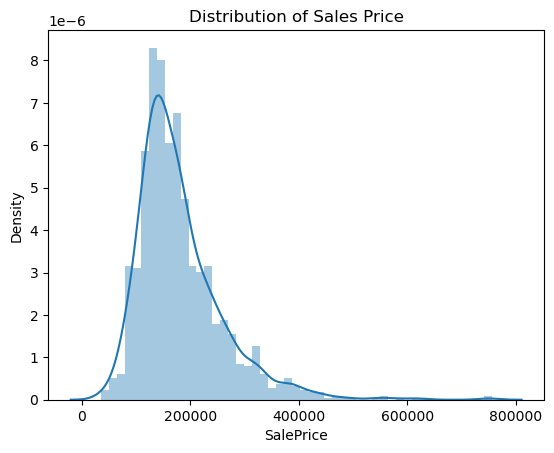

In [28]:
## Analyse the target variable 'SalePrice'
sns.distplot(df['SalePrice'])
plt.title("Distribution of Sales Price")

It can be seen that our target variable distribution is skewed. 
Removing the skewness to make the variable normally distributed uing log transformation.

In [29]:
df['SalePrice'] = np.log(df['SalePrice'])

Text(0.5, 1.0, 'Distribution of Sales Price')

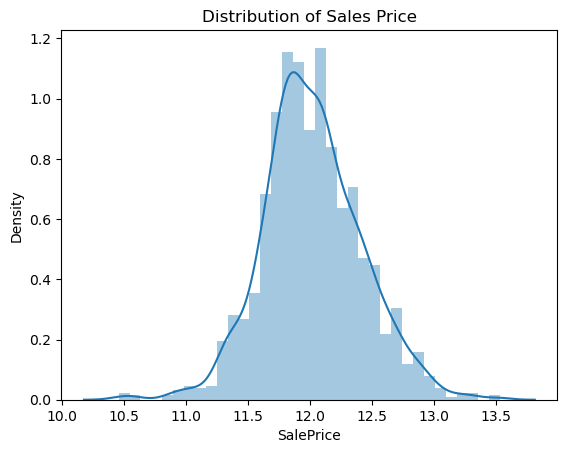

In [30]:
## Analyse the log transformed'SalePrice'
sns.distplot(df['SalePrice'])
plt.title("Distribution of Sales Price")

In [31]:
#selecting categorical features
df_cat = df.select_dtypes(include=['object']).columns

In [32]:
df_cat

Index(['MSSubClass', 'MSZoning', 'Street', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu',
       'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond',
       'PavedDrive', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition'],
      dtype='object')

In [33]:
len(df_cat)

45

In [34]:
#Plotting all categorical features to see the distribution of categories

def plot_categorical_univariate(df,df_cat,start,end):
    for i in range(start,end):
        plt.figure(figsize=(20, 5))
        plt.subplot(1,2,1)
        sns.countplot(x = df[df_cat[i]],  data = df)
        plt.xticks(rotation=90)
        plt.title("Distribution of "+df_cat[i])
        plt.subplot(1,2,2)
        sns.boxplot(x = df[df_cat[i]], y = 'SalePrice', data = df)
        plt.xticks(rotation=90)
        plt.title("Distribution of "+df_cat[i]+" w.r.t. SalesPrice")
        plt.show()

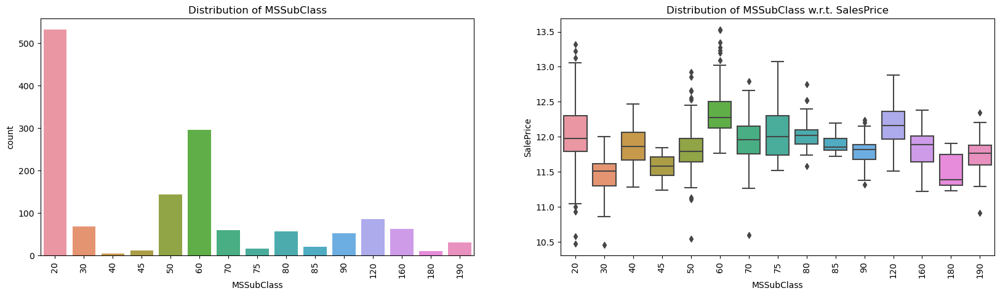

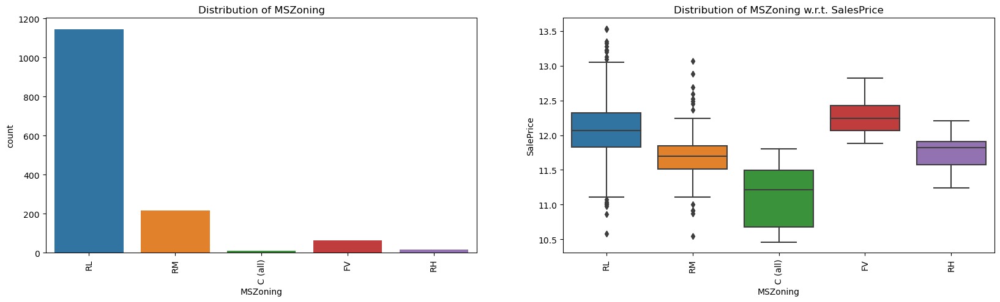

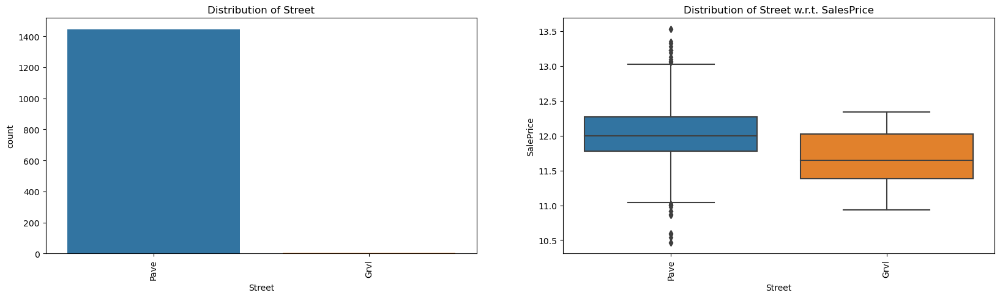

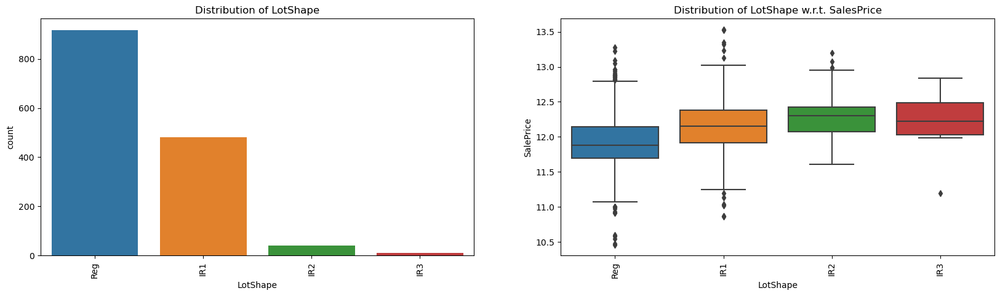

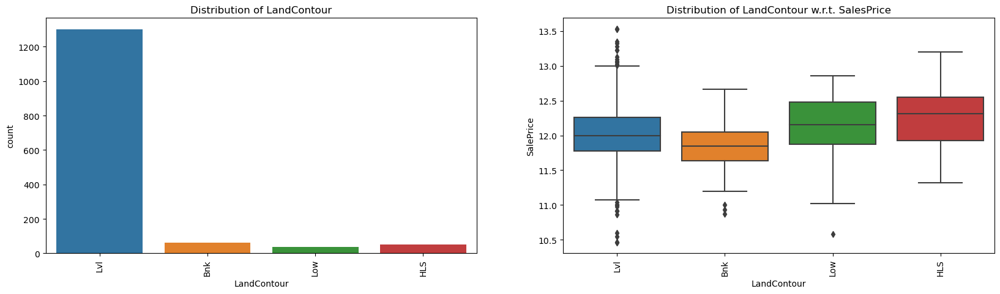

In [35]:
plot_categorical_univariate(df,df_cat,0,5)

MSZoning, Street, LotShape, LandContour fields have highly skewed data. 

We can handle them with following steps:
1. MSZoning - combine categories for "C(All)" and "RH" and create a new category as "Others". We cannot combine "FV" since the boxplot shows higher SalesPrice for "FV" than the other 2 categories.
2. Drop Street
3. LotShape - combine 'IR1', 'IR2', 'IR3' into new category as 'IR'
4. Drop LandContour - Since even the boxplot is not showing good difference in distribution.

In [36]:
df['MSZoning'] = df['MSZoning'].replace(['RH','C (all)'],'Others')

In [37]:
df['LotShape'] = df['LotShape'].replace(['IR1','IR2','IR3'],'IR')

In [38]:
df.drop(['Street','LandContour'],axis=1,inplace=True)

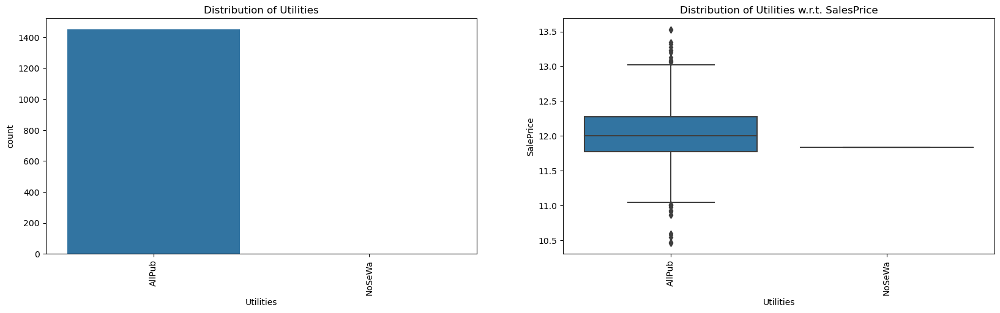

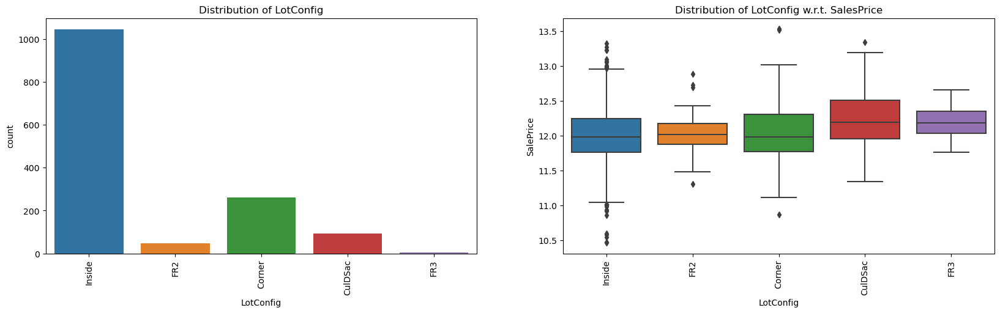

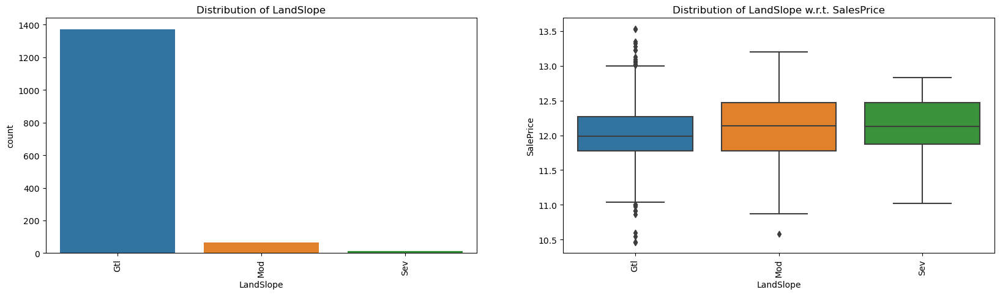

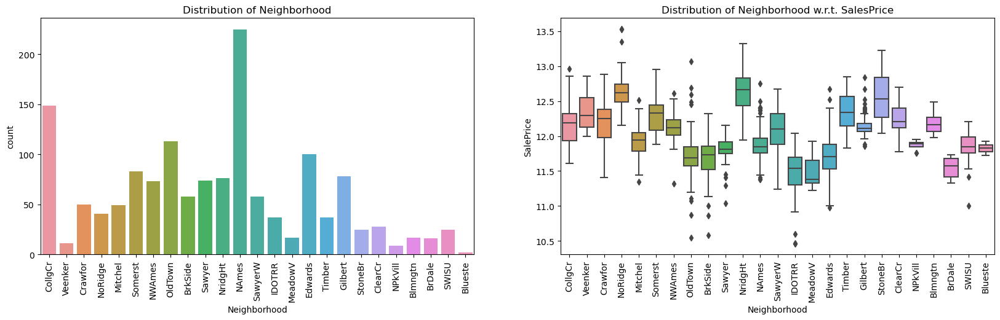

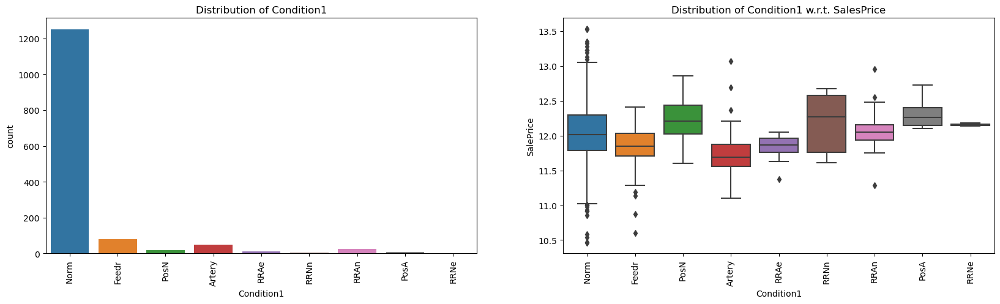

In [39]:
#Set 2
plot_categorical_univariate(df,df_cat,5,10)

Utilities, LotConfig, LandSlope, Condition1 fields have highly skewed data.

We can handle them with following steps:

1. Drop Utilities
2. LotConfig - Combine FR2 and FR3 into new category as "FR"
3. Drop LandSlope
4. Drop Condition1

In [40]:
df['LotConfig'] = df['LotConfig'].replace(['FR3','FR2'],'FR')

In [41]:
df.drop(['Utilities','LandSlope','Condition1'],axis=1,inplace=True)

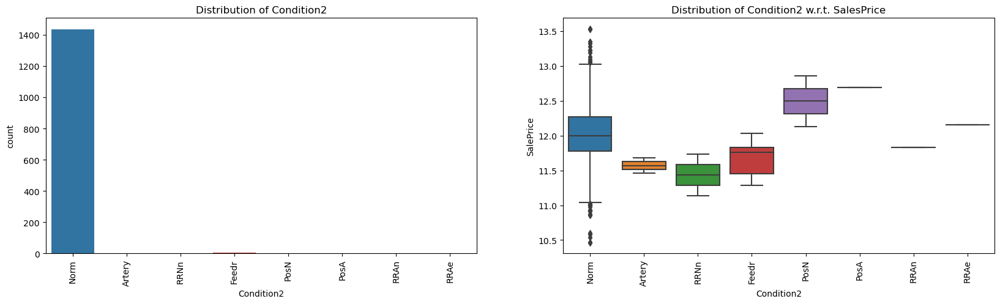

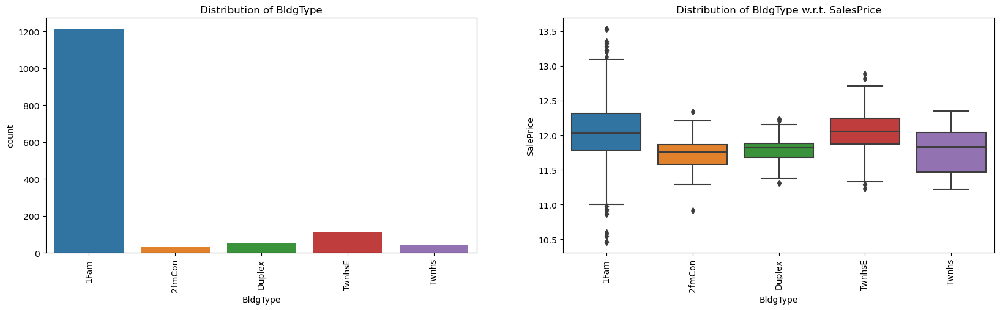

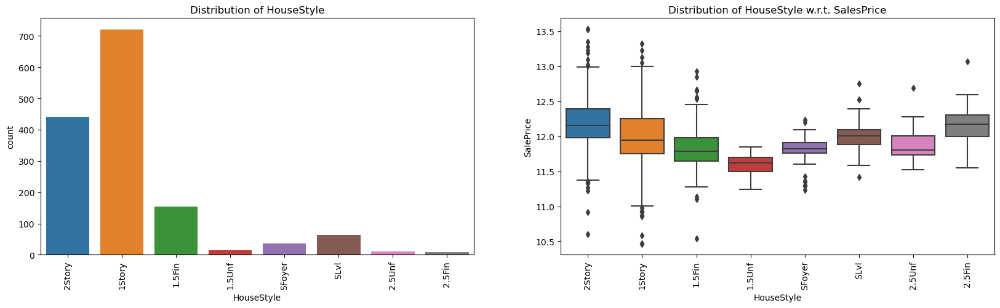

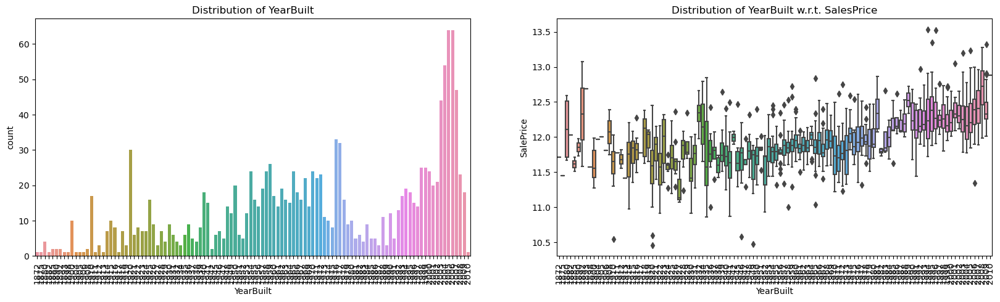

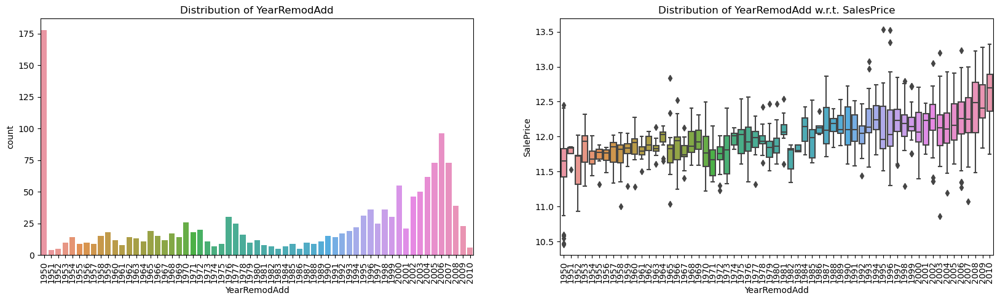

In [42]:
#Set 3
plot_categorical_univariate(df,df_cat,10,15)

Condition2, BldgType and HouseStyle fields have highly skewed data.

We can handle them with following steps:

1. Drop Condition2
2. BldgType - Combine '2fmCon' , 'Duplex', 'Twnhs' into new category as "Others"
3. HouseStyle - Combine 'SFoyer','1.5Unf','2.5Unf','2.5Fin' into new category as "Others"

In [43]:
df['BldgType']=df['BldgType'].replace(['2fmCon','Duplex','Twnhs'],'Others')
df['HouseStyle']=df['HouseStyle'].replace(['SFoyer','1.5Unf','2.5Unf','2.5Fin'],'Others')

In [44]:
df.drop(['Condition2'],axis=1,inplace=True)

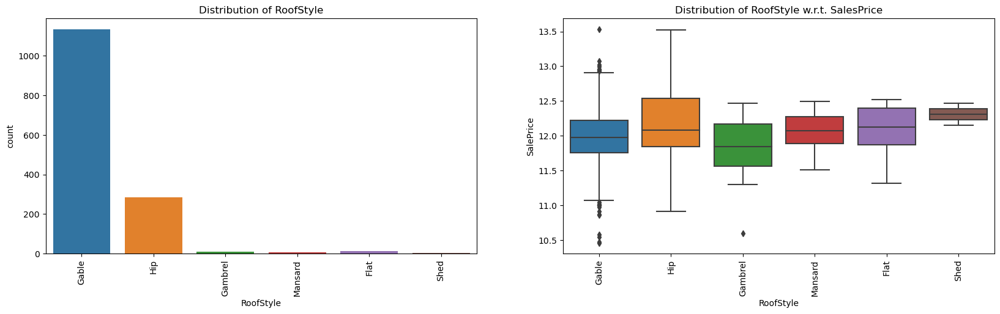

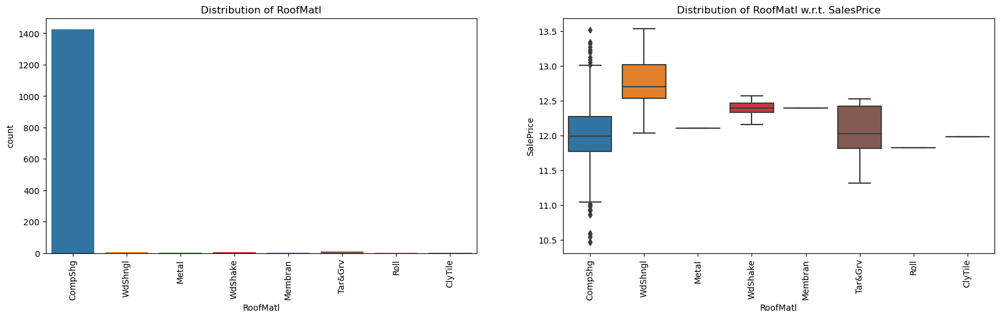

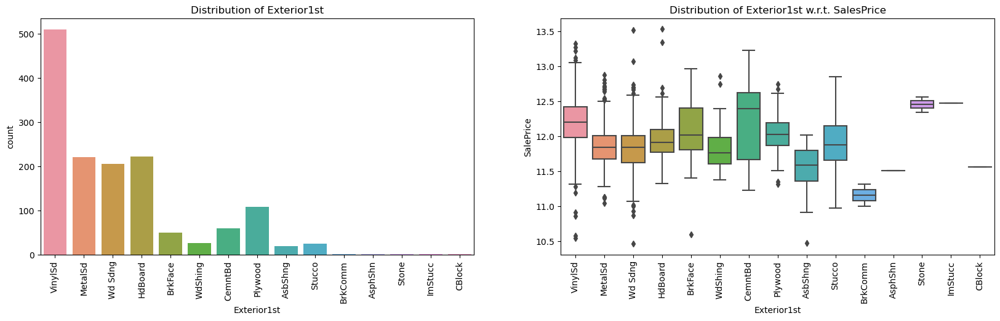

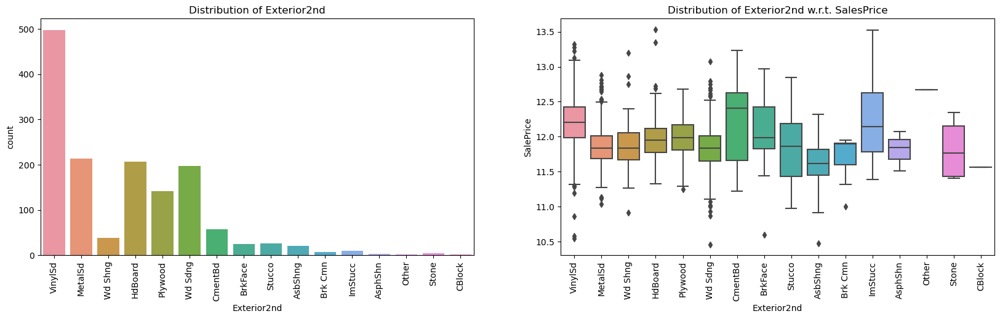

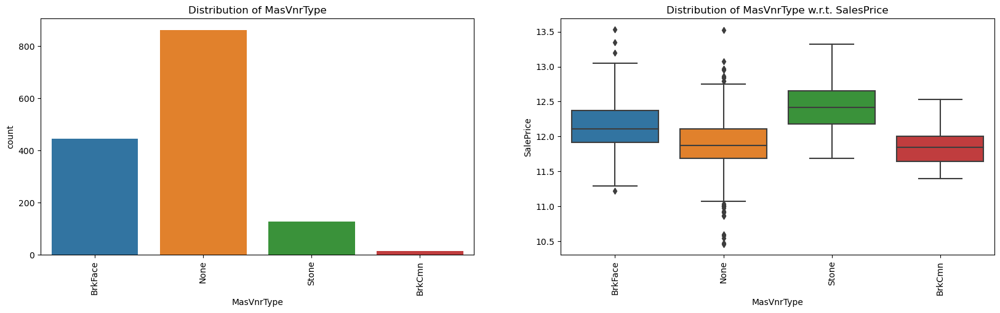

In [45]:
#set 4
plot_categorical_univariate(df,df_cat,15,20)

RoofStyle , RoofMatl, Exterior1st, Exterior2nd fields have highly skewed data.

We can handle them with following steps:

1. RoofStyle Combine 'Shed','Mansard','Gambrel','Flat' into new category as "Others"
2. Drop RoofMatl
3. Exterior1st - Combine 'AsphShn','ImStucc','CBlock','Stone','BrkComm','AsbShng','Stucco','WdShing' into "Others"
4. Exterior2nd - Combine 'Other','AsphShn','ImStucc','CBlock','Stone','BrkComm','AsbShng','Stucco','BrkFace' into "Others"

In [46]:
df['RoofStyle'] = df['RoofStyle'].replace(['Shed','Mansard','Gambrel','Flat'],'Others')

In [47]:
df['Exterior1st'] = df['Exterior1st'].replace(['AsphShn','ImStucc','CBlock','Stone','BrkComm','AsbShng','Stucco','WdShing'],'Others')
df['Exterior2nd'] = df['Exterior2nd'].replace(['Other','AsphShn','ImStucc','CBlock','Stone','BrkComm','AsbShng','Stucco','BrkFace'],'Others')

In [48]:
df.drop(['RoofMatl'],axis=1,inplace=True)

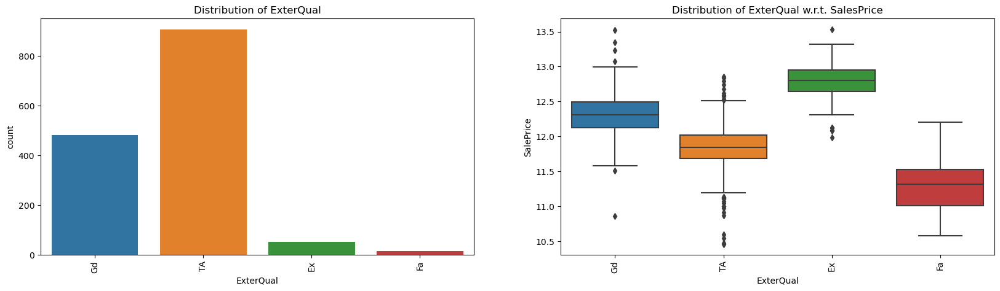

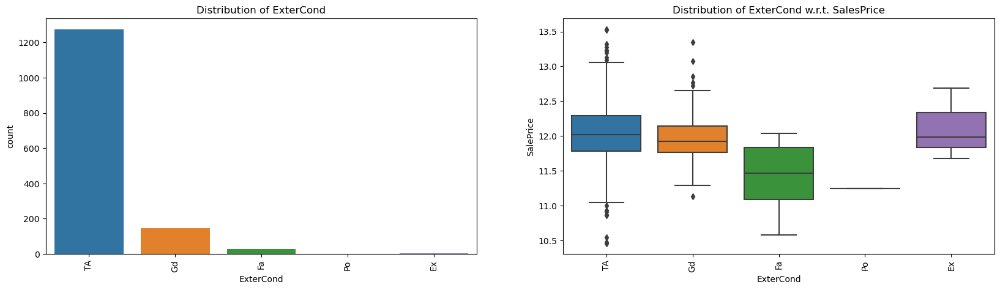

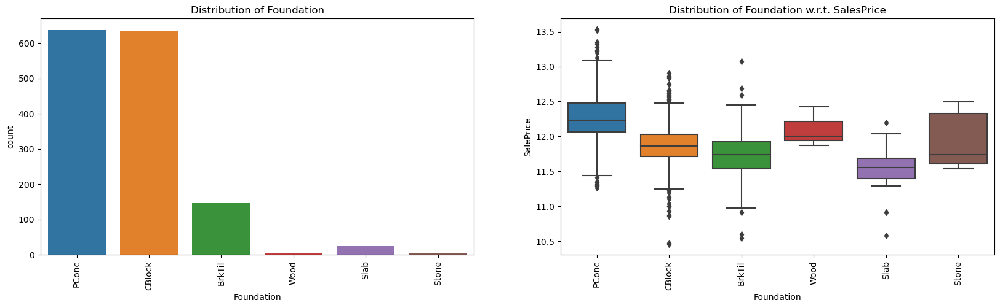

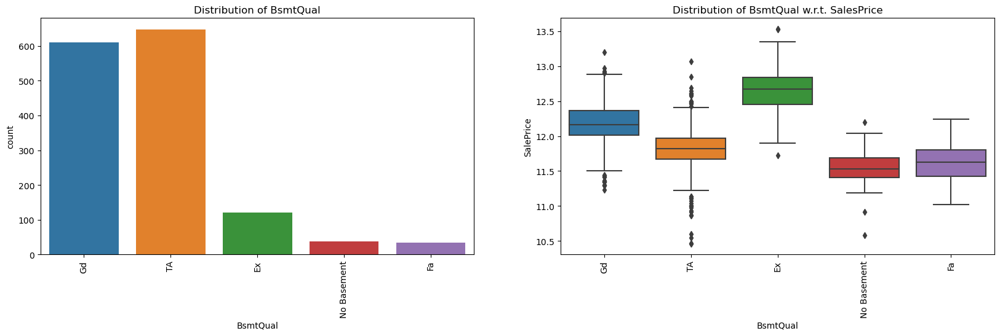

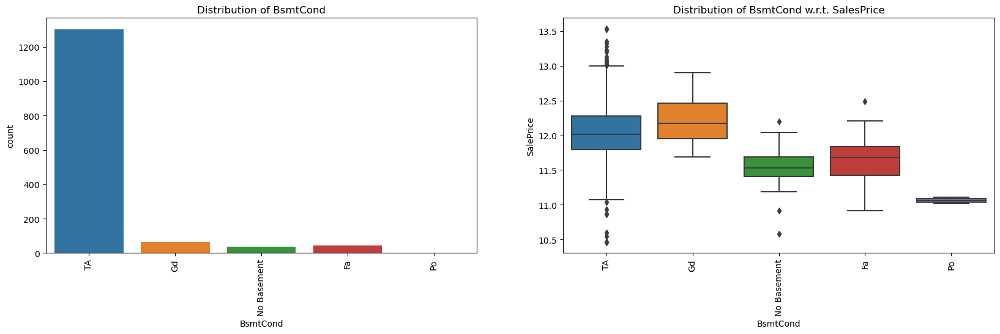

In [49]:
#Set 5
plot_categorical_univariate(df,df_cat,20,25)

ExterCond, Foundation, BsmtQual, BsmtCond fields have highly skewed data.

We can handle them with following steps:

1. Drop ExterCond
2. Foundation - Combine 'Slab','Stone','Wood' into "Others"
3. BsmtQual - Combine 'No Basement','Fa' into "Others"
4. Drop BsmtCond

In [50]:
df['Foundation'] = df['Foundation'].replace(['Slab','Stone','Wood'],'Others')
df['BsmtQual'] = df['BsmtQual'].replace(['No Basement','Fa'],'Others')

In [51]:
df.drop(['ExterCond','BsmtCond'],axis=1,inplace=True)

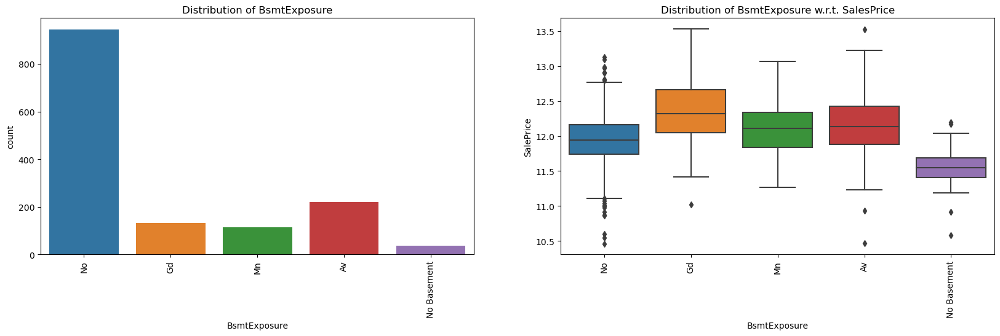

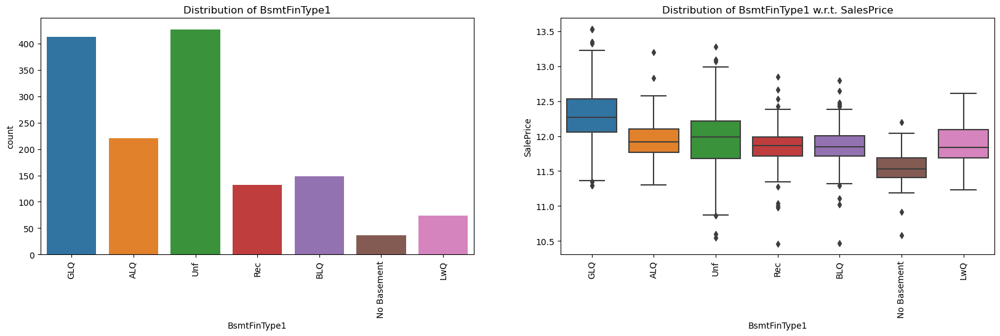

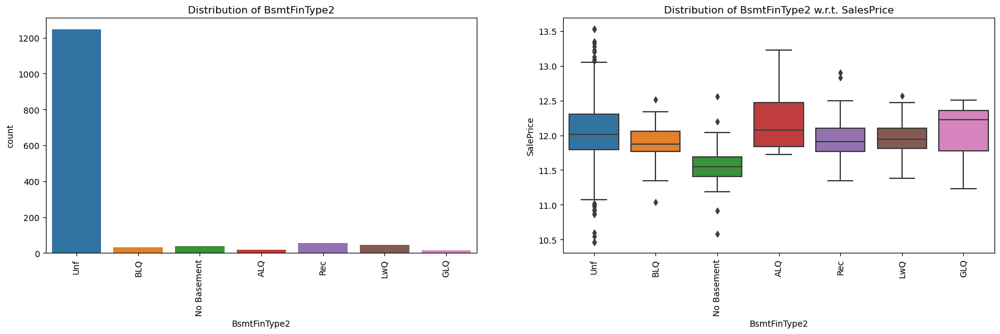

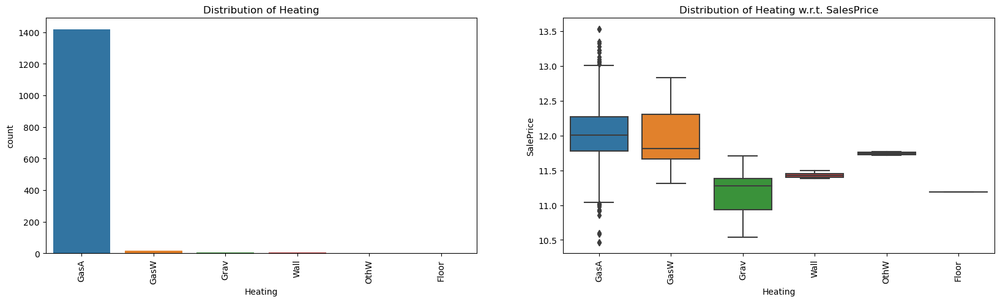

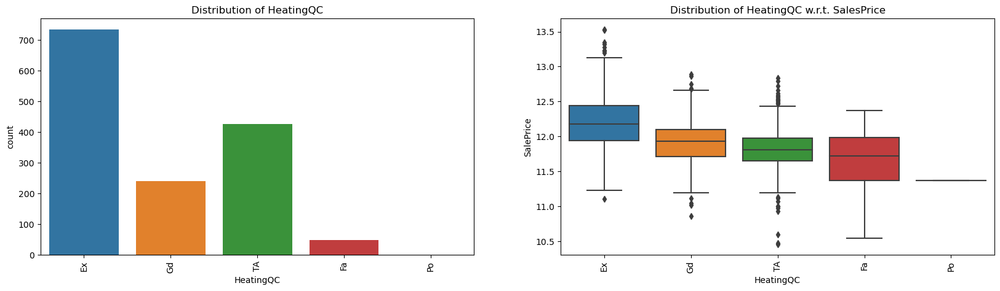

In [52]:
#Set 6
plot_categorical_univariate(df,df_cat,25,30)

BsmtExposure, BsmtFinType2, Heating fields have highly skewed data.

We can handle them with following steps:

1. BsmtExposure - Combine 'No Basement' with "No"
2. Drop BsmtFinType2
3. Drop Heating

In [53]:
df['BsmtExposure'] = df['BsmtExposure'].replace(['No Basement'],'No')

In [54]:
df.drop(['BsmtFinType2','Heating'],axis=1,inplace=True)

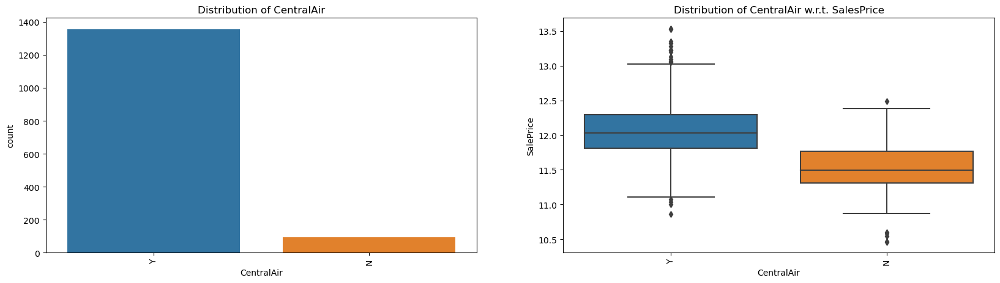

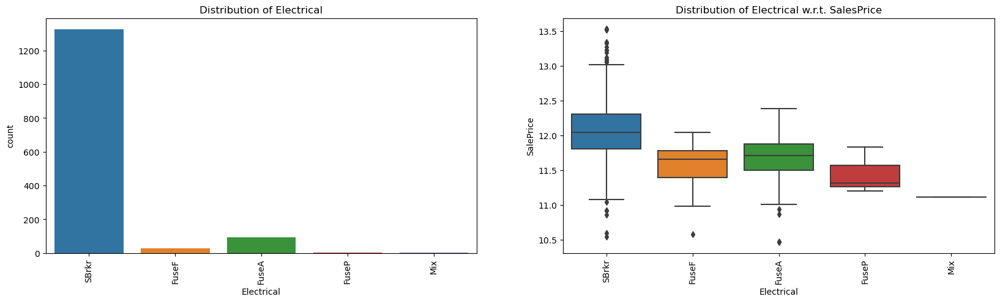

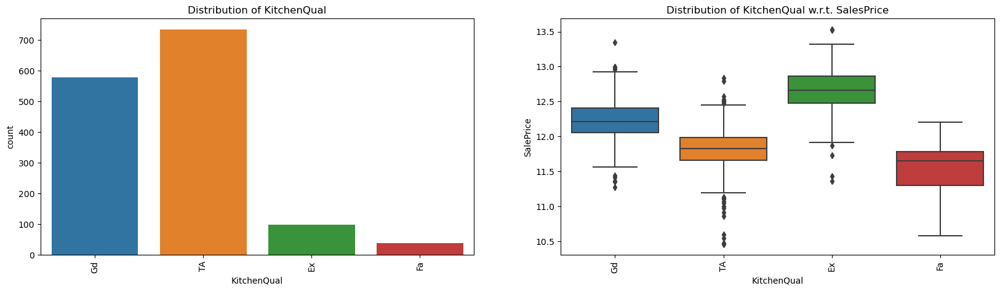

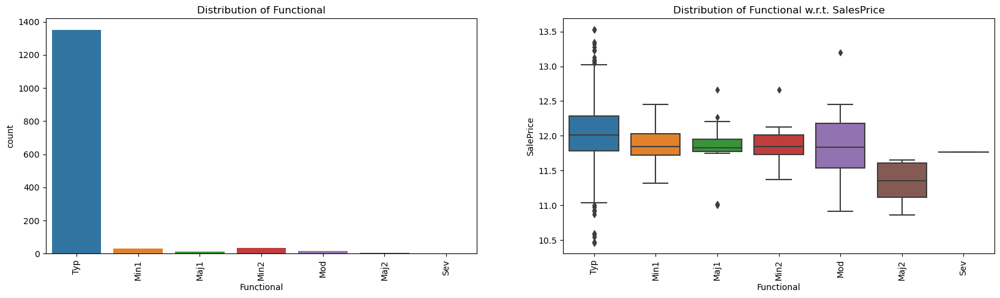

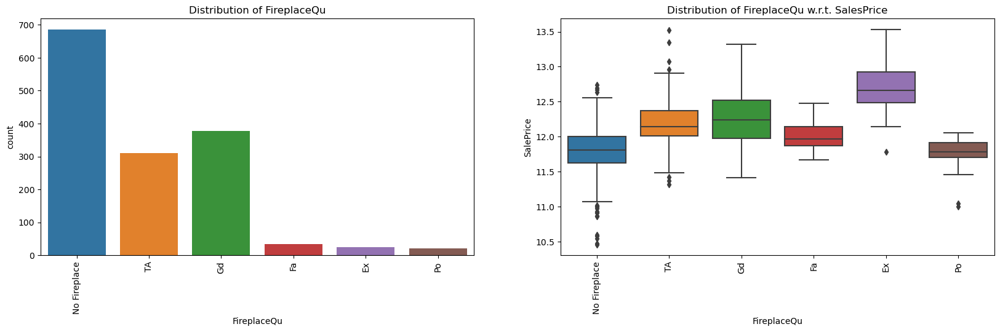

In [55]:
#Set 7
plot_categorical_univariate(df,df_cat,30,35)

CentralAir, Electrical, Functional, FireplaceQu fields have highly skewed data.

We can handle them with following steps:

1. Drop CentralAir
2. Drop Electrical
3. Drop Functional
4. FireplaceQu - Combine 'Fa', Ex', 'Po' into "Others"

In [56]:
df['FireplaceQu'] = df['FireplaceQu'].replace(['Fa','Ex','Po'],'Others')

In [57]:
df.drop(['CentralAir','Electrical','Functional'],axis=1,inplace=True)

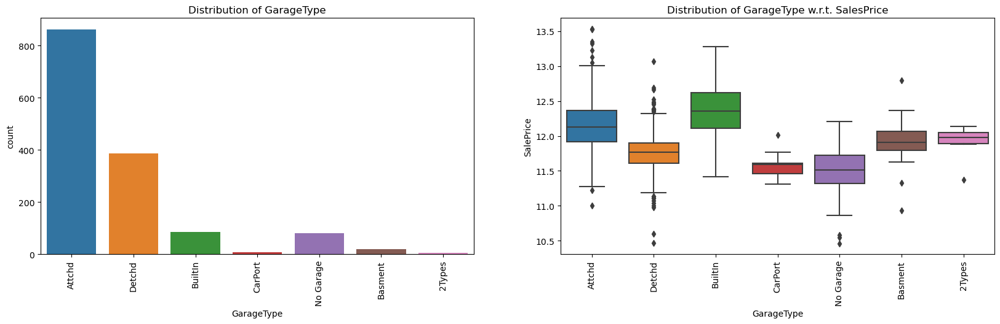

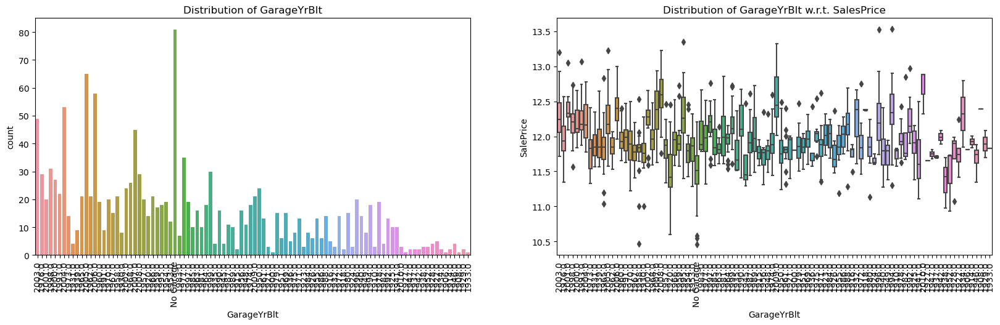

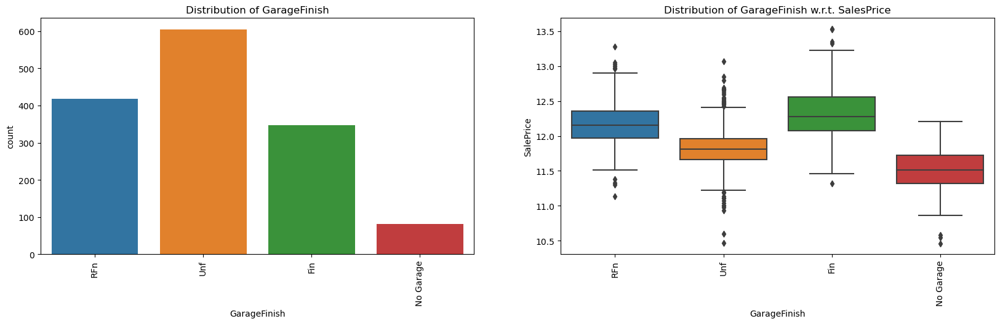

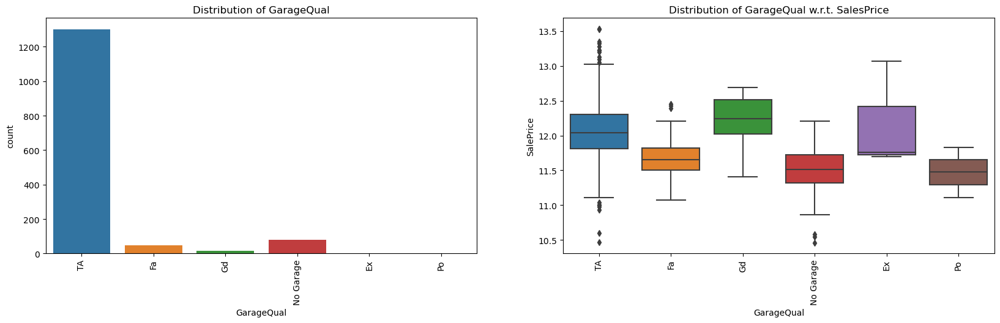

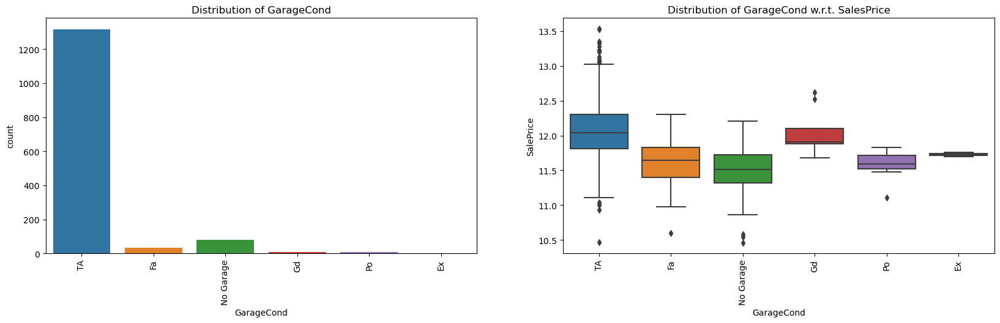

In [58]:
#Set 7
plot_categorical_univariate(df,df_cat,35,40)

GarageType, GarageQual, GarageCond fields have highly skewed data.

We can handle them with following steps:

1. GarageType - Combine 'Basment','CarPort','2Types' into "Others"
2. Drop GarageQual
3. Drop GarageCond

In [59]:
df['GarageType'] = df['GarageType'].replace(['Basment','CarPort','2Types'],'Others')

In [60]:
df.drop(['GarageQual', 'GarageCond'],axis=1,inplace=True)

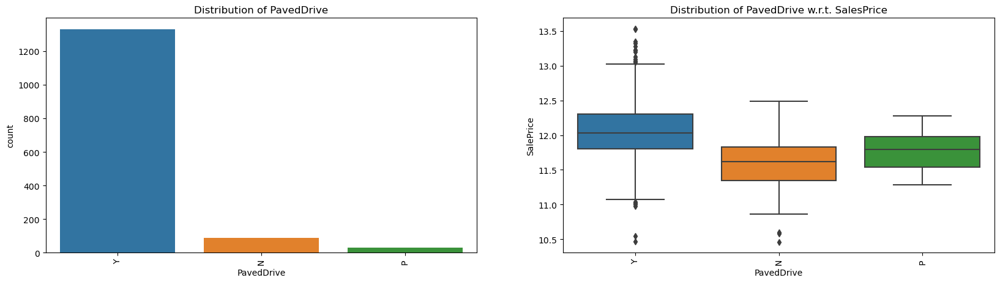

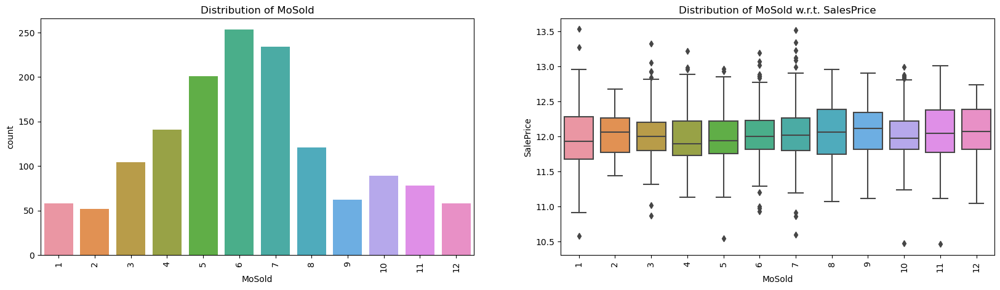

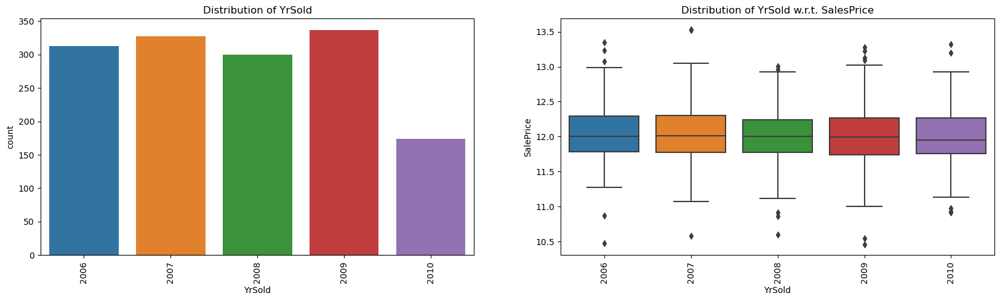

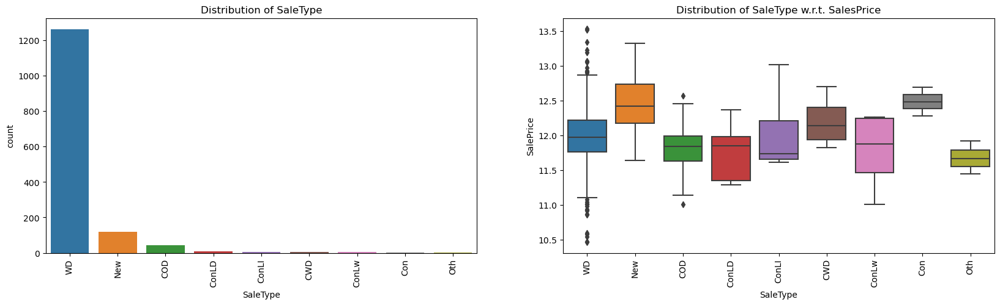

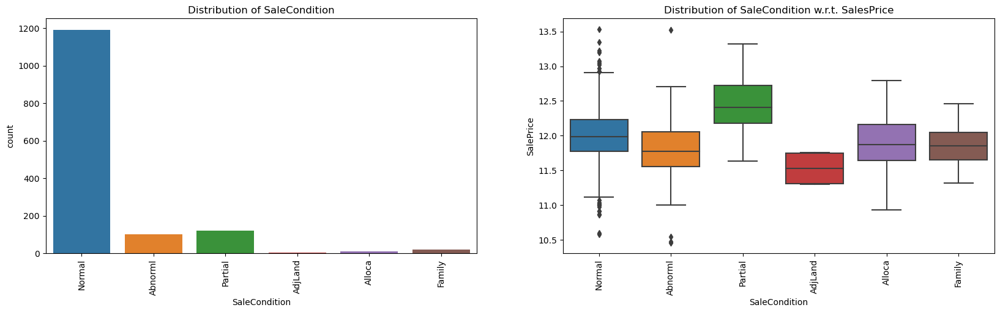

In [61]:
#Set 8
plot_categorical_univariate(df,df_cat,40,45)

PavedDrive, SaleType, SaleCondition fields have highly skewed data.

We can handle them with following steps:

1. Drop PavedDrive
2. Drop SaleType
3. SaleCondition - Combine 'Family','Alloca','AdjLand' into "Others"

In [62]:
df['SaleCondition'] = df['SaleCondition'].replace(['Family','Alloca','AdjLand'],'Others')

In [63]:
df.drop(['PavedDrive','SaleType'],axis=1,inplace=True)

In [64]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Reg,Inside,CollgCr,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,Gd,PConc,Gd,No,GLQ,706,0,150,856,Ex,856,854,0,1710,1,0,2,1,3,1,Gd,8,0,No Fireplace,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,2008,Normal,12.247694
1,2,20,RL,80.0,9600,Reg,FR,Veenker,1Fam,1Story,6,8,1976,1976,Gable,MetalSd,MetalSd,None,0.0,TA,CBlock,Gd,Gd,ALQ,978,0,284,1262,Ex,1262,0,0,1262,0,1,2,0,3,1,TA,6,1,TA,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,2007,Normal,12.109011
2,3,60,RL,68.0,11250,IR,Inside,CollgCr,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,Gd,PConc,Gd,Mn,GLQ,486,0,434,920,Ex,920,866,0,1786,1,0,2,1,3,1,Gd,6,1,TA,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,2008,Normal,12.317167
3,4,70,RL,60.0,9550,IR,Corner,Crawfor,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,Wd Shng,None,0.0,TA,BrkTil,TA,No,ALQ,216,0,540,756,Gd,961,756,0,1717,1,0,1,0,3,1,Gd,7,1,Gd,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,2006,Abnorml,11.849398
4,5,60,RL,84.0,14260,IR,FR,NoRidge,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,PConc,Gd,Av,GLQ,655,0,490,1145,Ex,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,1,TA,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,2008,Normal,12.429216


In [65]:
#selecting categorical features
df_num = df.select_dtypes(include=['int64','float64']).columns

In [66]:
len(df_num)

32

In [67]:
#Plotting all categorical features to see the distribution of categories

def plot_numerical_univariate(df,df_num,start,end):
    for i in range(start,end):
        plt.figure(figsize=(20, 5))
        plt.subplot(1,2,1)
        sns.distplot(x = df[df_num[i]])
        plt.xticks(rotation=90)
        plt.title("Distribution of "+df_num[i])
        plt.subplot(1,2,2)
        sns.boxplot(x = df[df_num[i]], data = df)
        plt.xticks(rotation=90)
        plt.title("Boxplot of "+df_num[i])
        plt.show()

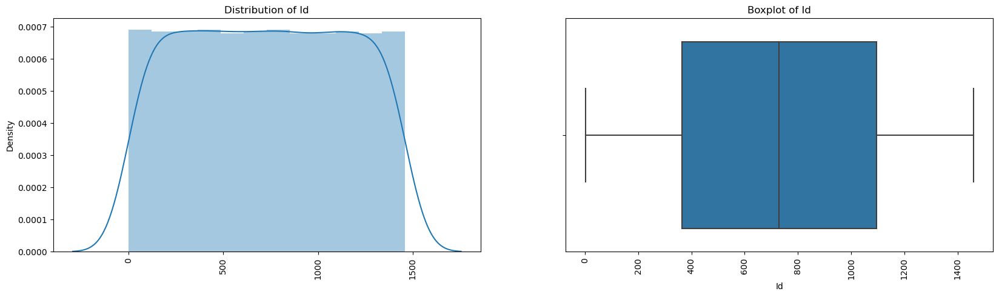

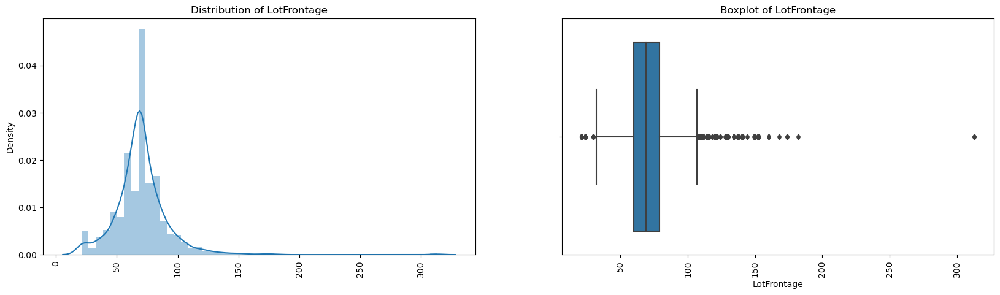

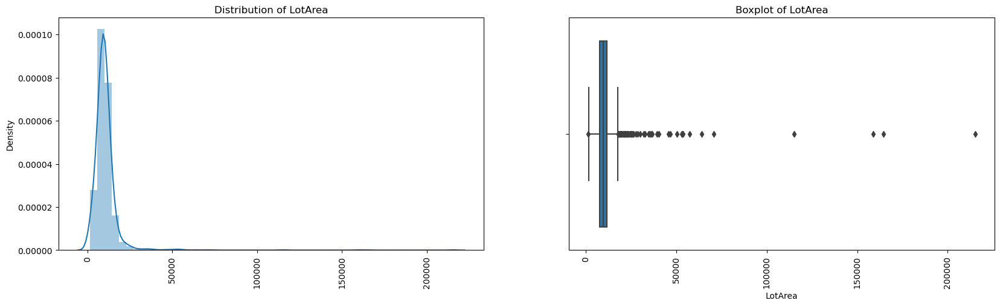

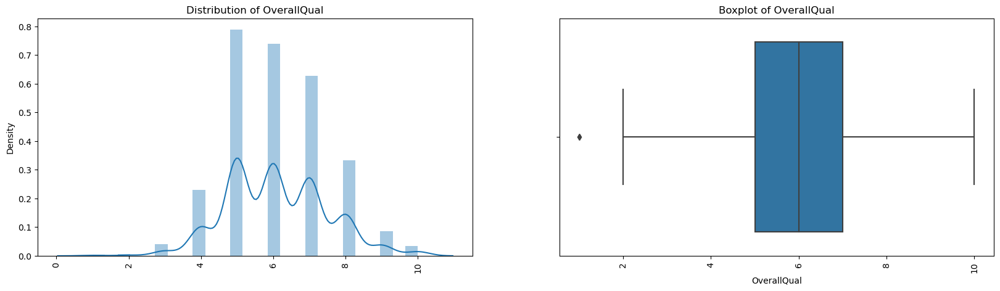

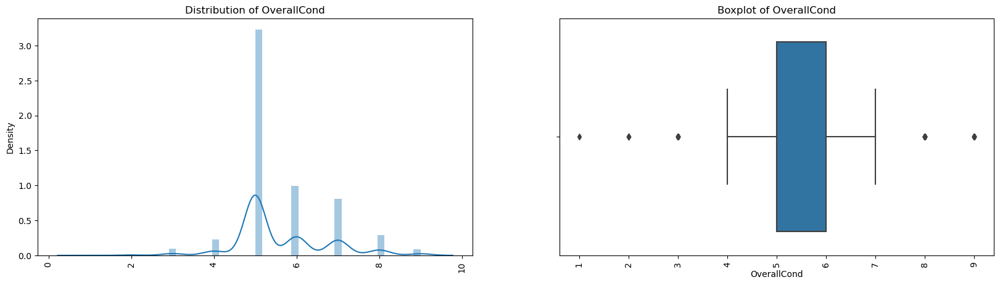

In [68]:
#Set 1
plot_numerical_univariate(df,df_num,0,5)

Fields which are highly skewed data and have outliers are
- LotFrontage
- LotArea fields have highly skewed data and have outliers.

We can remove the outliers using IQR method:

In [69]:
def remove_outlier(ser):
    Q1,Q3 = ser.quantile([0.25,0.75])
    IQR = Q3-Q1

    lower_bound = Q1 - 1.5*IQR
    upper_bound = Q3 + 1.5*IQR
    
    ser = ser.apply(lambda x: x if x>=lower_bound else lower_bound)
    ser = ser.apply(lambda x: x if x<=upper_bound else upper_bound)
    
    return ser

In [70]:
df['LotFrontage'] = remove_outlier(df['LotFrontage'])

In [71]:
df['LotArea'] = remove_outlier(df['LotArea'])

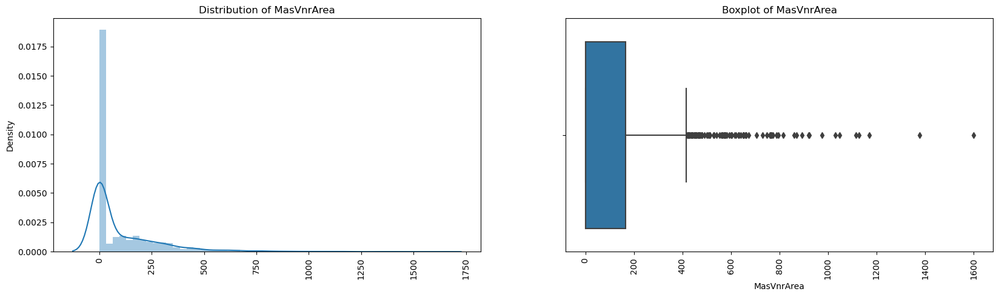

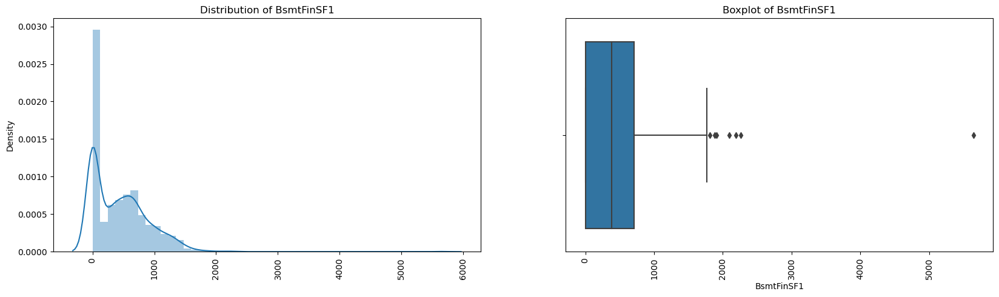

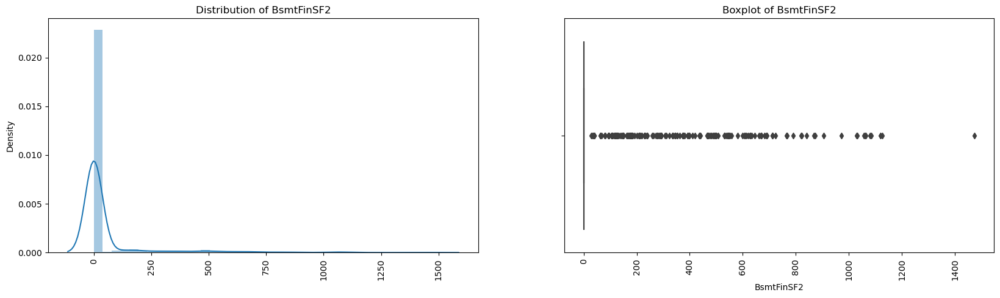

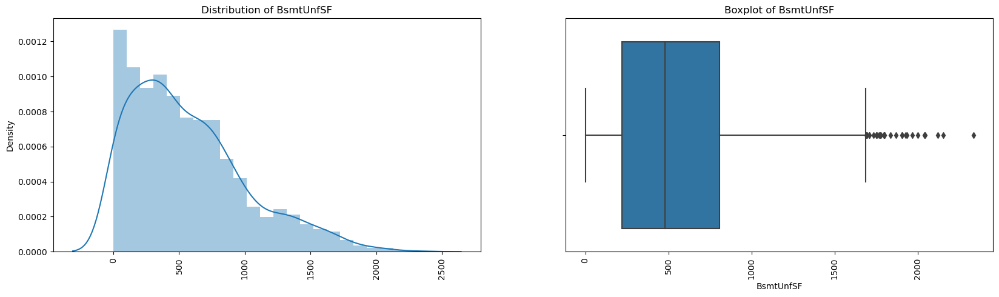

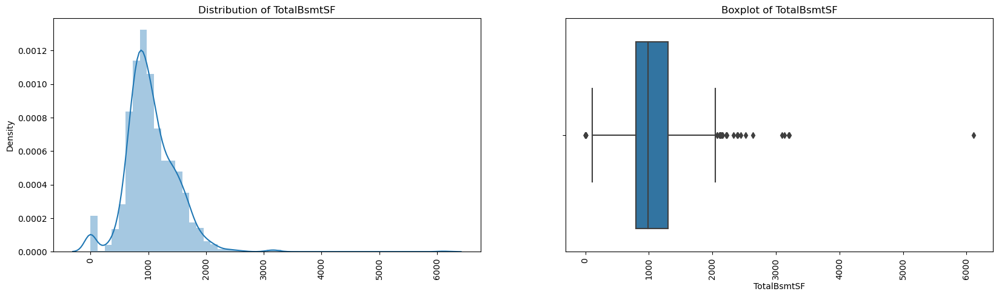

In [72]:
#set 2
plot_numerical_univariate(df,df_num,5,10)

Fields which are highly skewed data and have outliers are
- MasVnrArea
- BsmtFinSF1
- BsmtFinSF2 -- Remove this field as there is major 0 values
- BsmtUnfSF
- TotalBsmtSF

We can remove the outliers using IQR method.


In [73]:
df['BsmtFinSF2'].value_counts()

0       1284
180        5
374        3
551        2
147        2
        ... 
532        1
165        1
1120       1
311        1
1029       1
Name: BsmtFinSF2, Length: 144, dtype: int64

In [74]:
df.drop(['BsmtFinSF2'], axis=1, inplace=True)

In [75]:
df['MasVnrArea'] = remove_outlier(df['MasVnrArea'])
df['BsmtFinSF1'] = remove_outlier(df['BsmtFinSF1'])
df['BsmtUnfSF'] = remove_outlier(df['BsmtUnfSF'])
df['TotalBsmtSF'] = remove_outlier(df['TotalBsmtSF'])

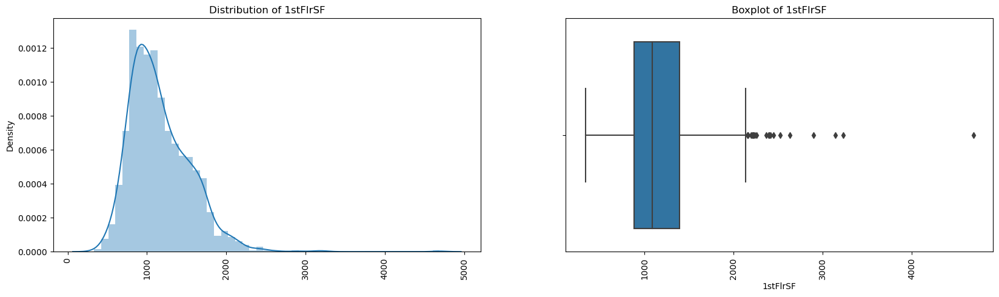

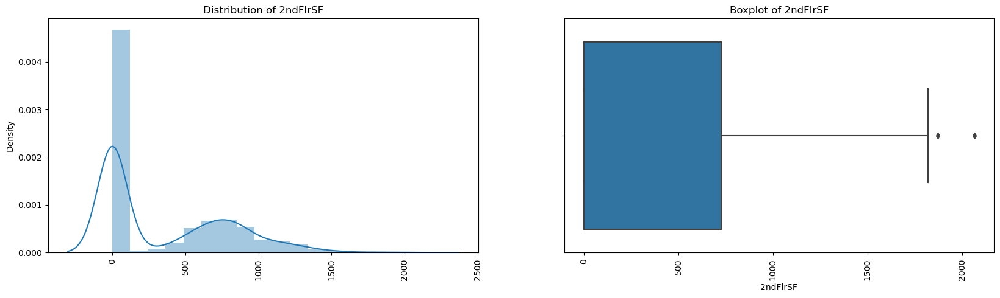

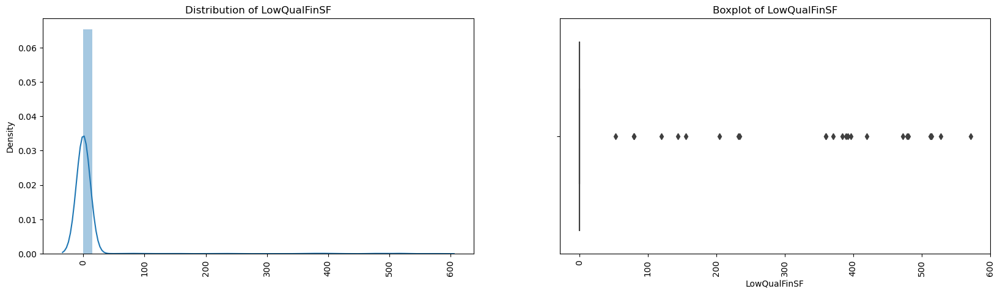

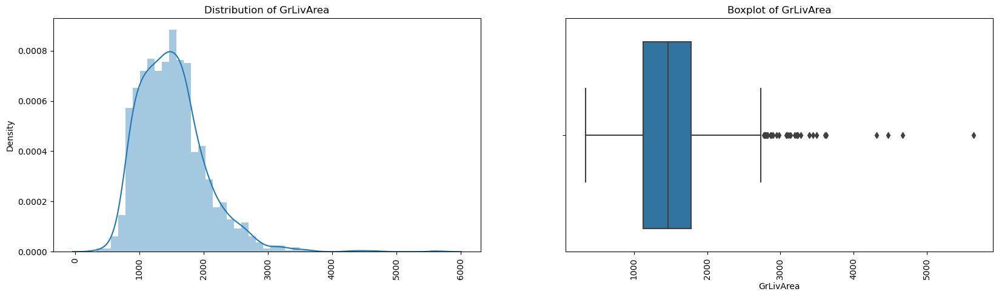

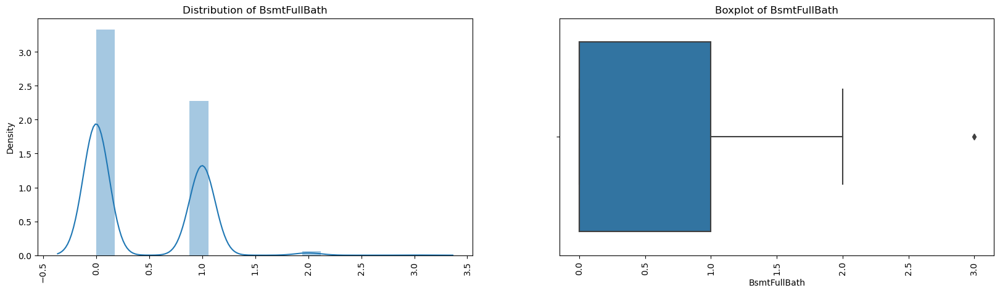

In [76]:
#set 3
plot_numerical_univariate(df,df_num,10,15)

In [77]:
df_num[10:15]

Index(['1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath'], dtype='object')

Fields which are highly skewed data and have outliers are
- 1stFlrSF
- 2ndFlrSF
- LowQualFinSF -- Remove this field as there is major 0 values
- GrLivArea

We can remove the outliers using IQR method.

In [78]:
df['LowQualFinSF'].value_counts()

0      1425
80        3
360       2
205       1
479       1
397       1
514       1
120       1
481       1
232       1
53        1
515       1
156       1
473       1
420       1
390       1
371       1
392       1
144       1
572       1
528       1
234       1
513       1
384       1
Name: LowQualFinSF, dtype: int64

In [79]:
df.drop(['LowQualFinSF'], axis=1, inplace=True)

In [80]:
df['1stFlrSF'] = remove_outlier(df['1stFlrSF'])
df['2ndFlrSF'] = remove_outlier(df['2ndFlrSF'])
df['GrLivArea'] = remove_outlier(df['GrLivArea'])

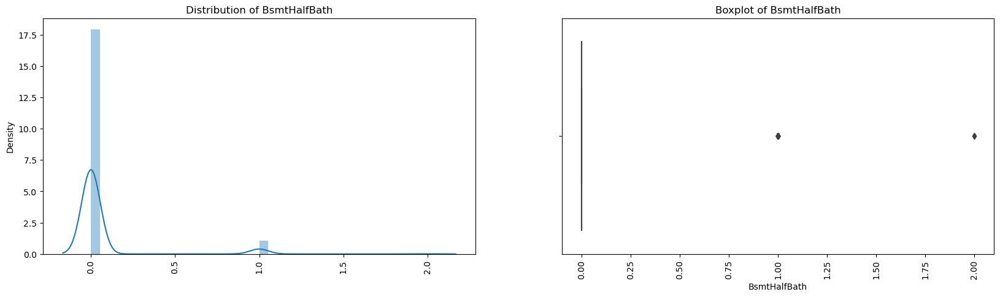

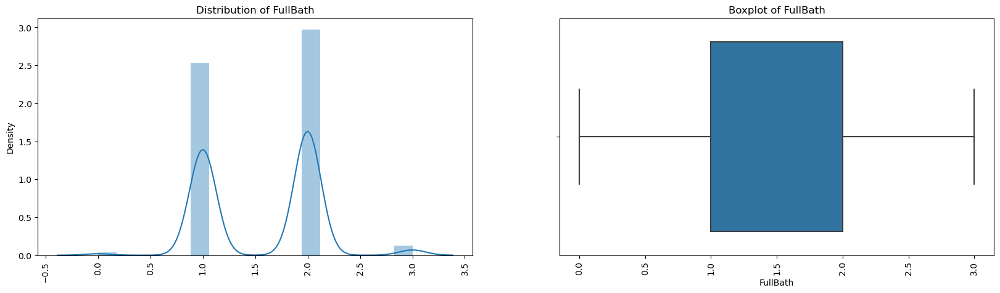

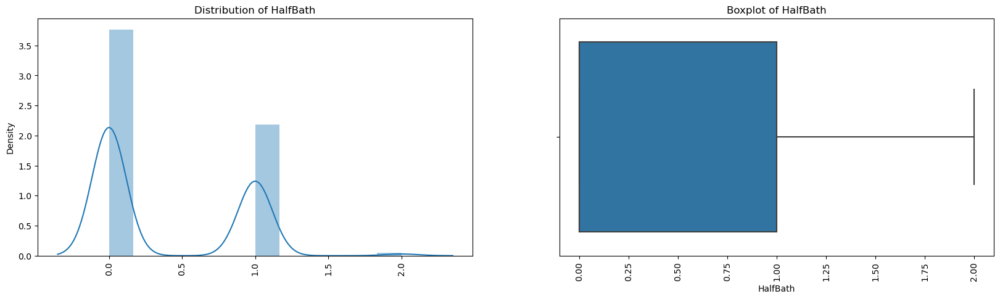

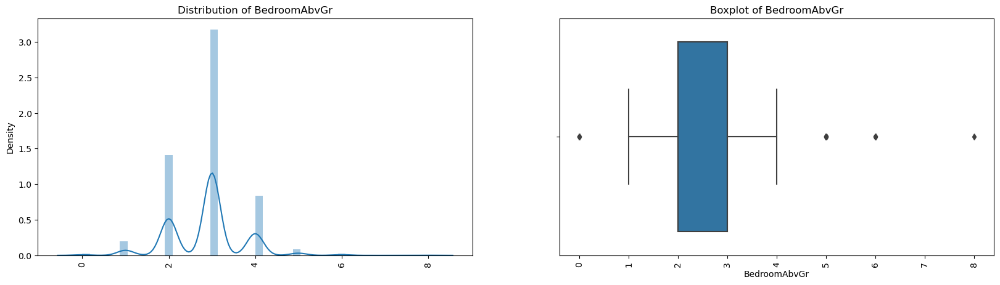

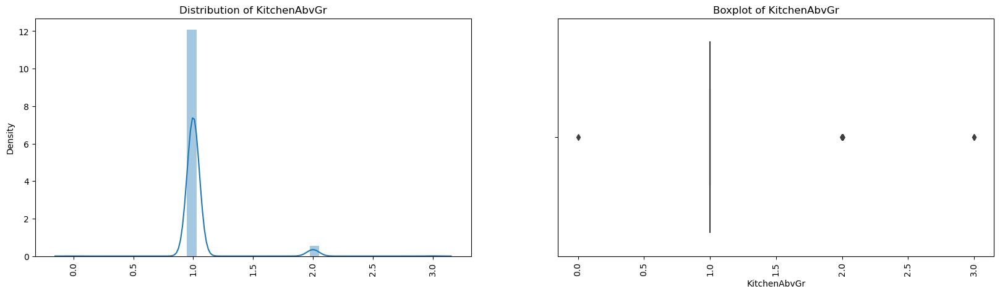

In [81]:
#set 4
plot_numerical_univariate(df,df_num,15,20)

In [82]:
df_num[15:20]

Index(['BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr'], dtype='object')

Fields which are highly skewed data and have outliers are
- BedroomAbvGr

We can remove the outliers using IQR method.

In [83]:
df['BedroomAbvGr'] = remove_outlier(df['BedroomAbvGr'])

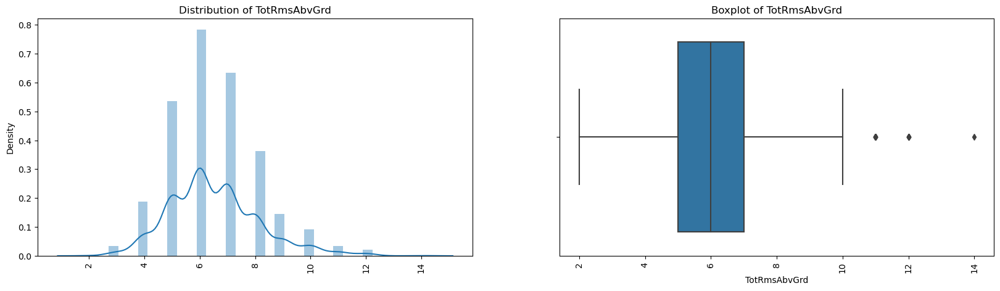

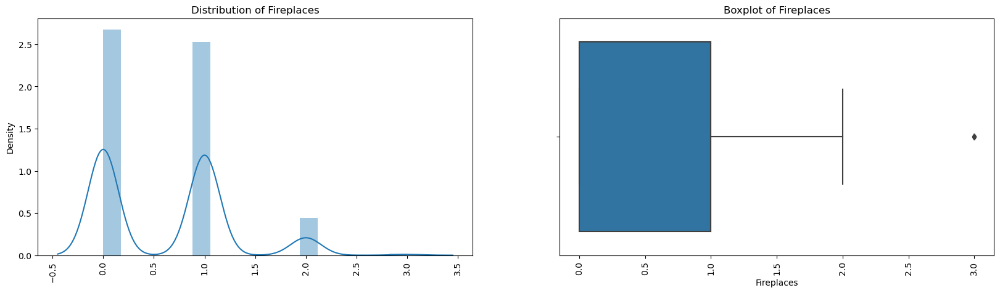

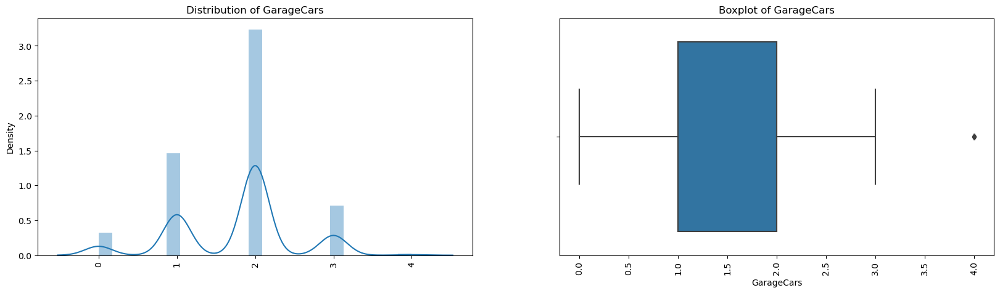

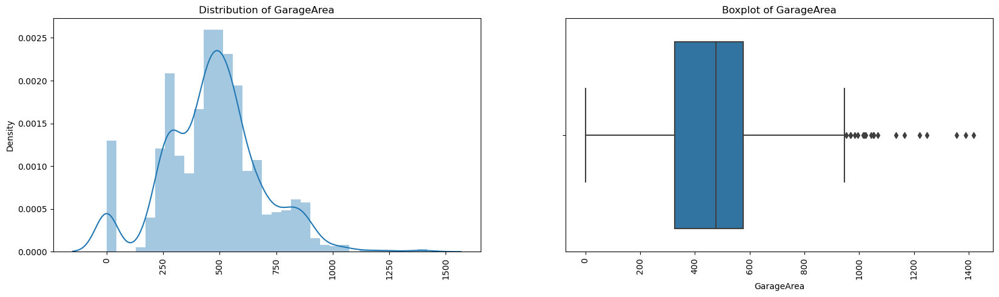

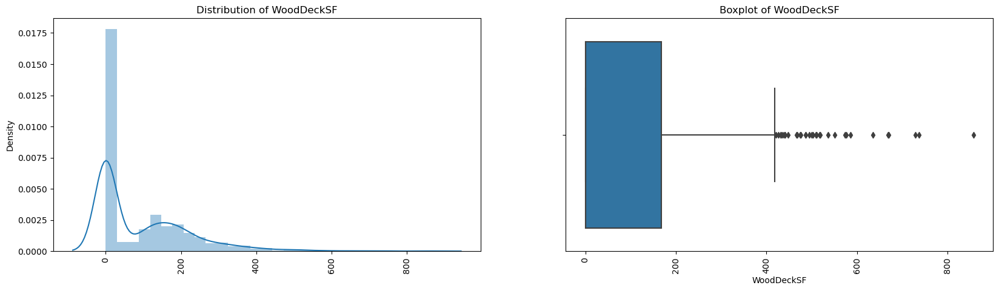

In [84]:
#set 5
plot_numerical_univariate(df,df_num,20,25)

In [85]:
df_num[20:25]

Index(['TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF'], dtype='object')

Fields which are highly skewed data and have outliers are
- TotRmsAbvGrd
- GarageArea
- WoodDeckSF

We can remove the outliers using IQR method.

In [86]:
df['TotRmsAbvGrd'] = remove_outlier(df['TotRmsAbvGrd'])
df['GarageArea'] = remove_outlier(df['GarageArea'])
df['WoodDeckSF'] = remove_outlier(df['WoodDeckSF'])

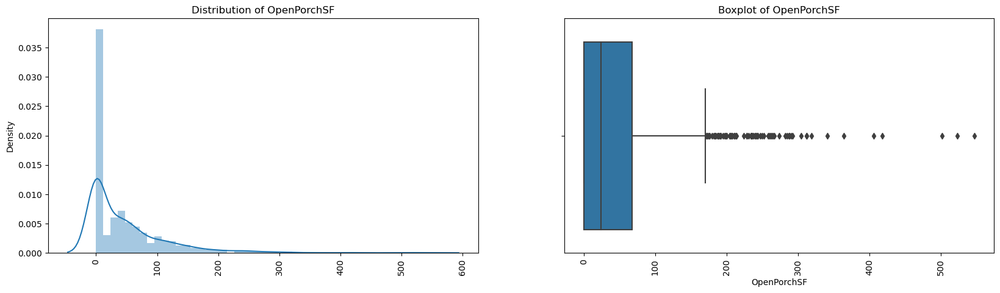

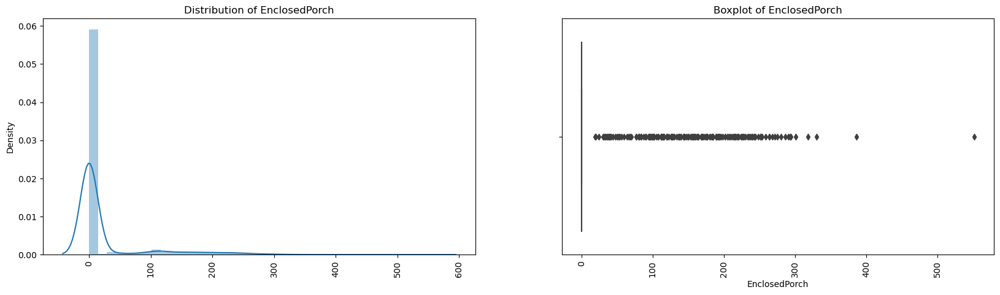

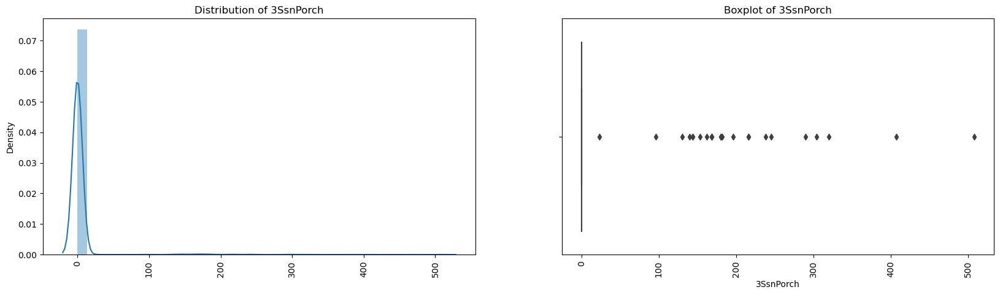

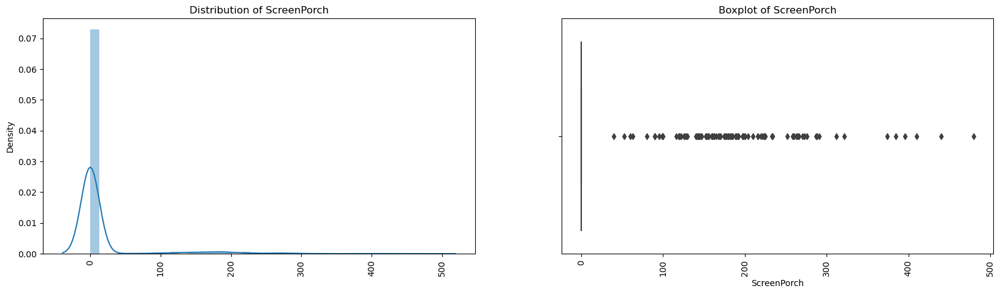

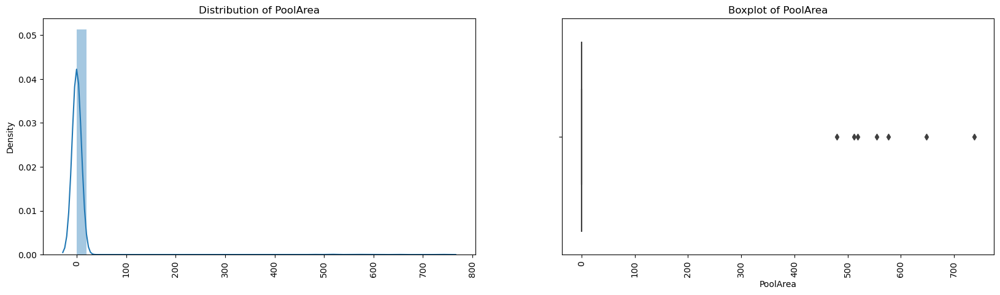

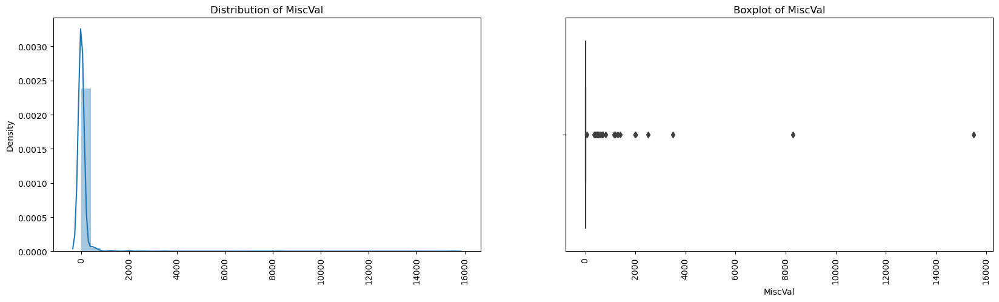

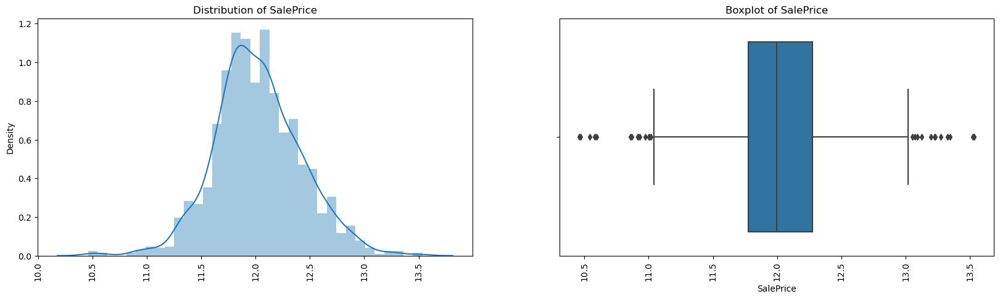

In [87]:
#set 6
plot_numerical_univariate(df,df_num,25,32)

In [88]:
df_num[25:32]

Index(['OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'SalePrice'],
      dtype='object')

Fields which are highly skewed data and have outliers are
- OpenPorchSF
- EnclosedPorch -- Remove this field as there is major 0 values
- 3SsnPorch -- Remove this field as there is major 0 values
- ScreenPorch -- Remove this field as there is major 0 values
- PoolArea -- Remove this field as there is major 0 values
- MiscVal -- Remove this field as there is major 0 values

We can remove the outliers using IQR method.

In [89]:
df['EnclosedPorch'].value_counts().head()

0      1244
112      15
96        6
144       5
192       5
Name: EnclosedPorch, dtype: int64

In [90]:
df['3SsnPorch'].value_counts().head()

0      1427
168       3
144       2
180       2
216       2
Name: 3SsnPorch, dtype: int64

In [91]:
df['ScreenPorch'].value_counts().head()

0      1335
192       6
120       5
224       5
189       4
Name: ScreenPorch, dtype: int64

In [92]:
df['PoolArea'].value_counts().head()

0      1444
512       1
648       1
576       1
555       1
Name: PoolArea, dtype: int64

In [93]:
df['MiscVal'].value_counts().head()

0      1399
400      11
500       8
700       5
450       4
Name: MiscVal, dtype: int64

In [94]:
df['OpenPorchSF'] = remove_outlier(df['OpenPorchSF'])

### Bivariate Analysis

Start with correlation plot

<AxesSubplot:>

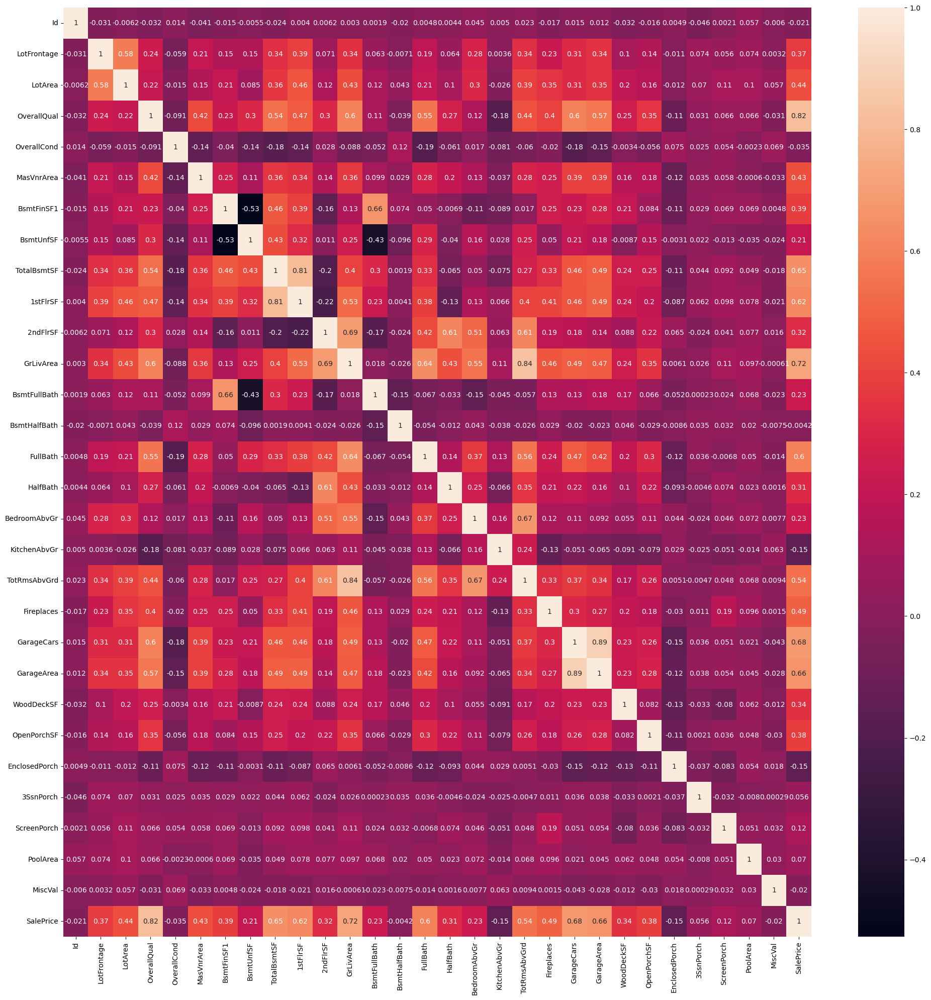

In [95]:
plt.figure(figsize=(24, 24))
sns.heatmap(df.corr(), annot = True)

With above heatmap of correlations, it can be seen that
1. 1stFlrSF and TotalBsmtSF are highly correlatated with 0.81
2. TotRmsAbvGrd and GrLivArea are highly correlatated with 0.84
3. GarageArea and GarageCards are highly correlatated with 0.89

We can remove 1 feature from these pairs.

In [96]:
df.drop(['1stFlrSF', 'TotRmsAbvGrd', 'GarageArea'], axis=1, inplace = True)

Lets look at pair plot

In [99]:
sns.pairplot(df)

### Analyzing date realated features

There are 4 date related fields which are:
1. YearBuilt
2. YearRemodAdd
3. MoSold
4. YrSold
5. GarageYrBlt

These features can be transformed in following way

1. Calculate difference between YearBuilt and YrSold to create a new feature as Age of the property when sold.
2. If YearBuilt and yearRemodAdd are same then 0 and if they are different then 1 and create a new feature as "Remodelled"
3. Drop GarageYrBlt

In [97]:
df['Age'] = df['YrSold'].astype(np.int64) - df['YearBuilt'].astype(np.int64)

In [98]:
df['Age'].describe()

count    1451.000000
mean       36.722950
std        30.238849
min         0.000000
25%         8.000000
50%        35.000000
75%        54.500000
max       136.000000
Name: Age, dtype: float64

In [99]:
df['Remodelled'] = df['YearBuilt'] == df['YearRemodAdd']

In [100]:
#dropping YearBuilt, YearRemodAdd and YrSold
df.drop(['YearBuilt', 'YearRemodAdd' , 'YrSold', 'GarageYrBlt'], axis=1, inplace=True)

In [101]:
#dropping ID column
df.drop(['Id'], axis=1, inplace=True)

## Feature Engineering

In [102]:
#Getting numerical and categorical column list
NumericalCols = df.select_dtypes(include=['int64','float64']).columns
CategoricalCols = df.select_dtypes(include=['object']).columns

print('Numerical columns:\n',NumericalCols)

print('\nCatgorical columns:\n',CategoricalCols)

Numerical columns:
 Index(['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '2ndFlrSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'Fireplaces', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'SalePrice', 'Age'],
      dtype='object')

Catgorical columns:
 Index(['MSSubClass', 'MSZoning', 'LotShape', 'LotConfig', 'Neighborhood',
       'BldgType', 'HouseStyle', 'RoofStyle', 'Exterior1st', 'Exterior2nd',
       'MasVnrType', 'ExterQual', 'Foundation', 'BsmtQual', 'BsmtExposure',
       'BsmtFinType1', 'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageType',
       'GarageFinish', 'MoSold', 'SaleCondition'],
      dtype='object')


#### One-hot encoding for categorical features

In [103]:
#get dummies for all other categorical variables
df_dummy = pd.get_dummies(df[CategoricalCols], drop_first=True)

In [104]:
#merge with original dataframe
df = pd.concat([df, df_dummy], axis=1)

In [105]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SaleCondition,SalePrice,Age,Remodelled,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_Others,MSZoning_RL,MSZoning_RM,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,BldgType_Others,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,HouseStyle_SLvl,RoofStyle_Hip,RoofStyle_Others,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Others,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Others,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,Foundation_CBlock,Foundation_Others,Foundation_PConc,BsmtQual_Gd,BsmtQual_Others,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No Basement,BsmtFinType1_Rec,BsmtFinType1_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_No Fireplace,FireplaceQu_Others,FireplaceQu_TA,GarageType_BuiltIn,GarageType_Detchd,GarageType_No Garage,GarageType_Others,GarageFinish_No Garage,GarageFinish_RFn,GarageFinish_Unf,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9,MoSold_10,MoSold_11,MoSold_12,SaleCondition_Normal,SaleCondition_Others,SaleCondition_Partial
0,60,RL,65.0,8450.0,Reg,Inside,CollgCr,1Fam,2Story,7,5,Gable,VinylSd,VinylSd,BrkFace,196.0,Gd,PConc,Gd,No,GLQ,706.0,150.0,856.0,Ex,854.0,1710.0,1,0,2,1,3.0,1,Gd,0,No Fireplace,Attchd,RFn,2,0.0,61.0,0,0,0,0,0,2,Normal,12.247694,5,True,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
1,20,RL,80.0,9600.0,Reg,FR,Veenker,1Fam,1Story,6,8,Gable,MetalSd,MetalSd,None,0.0,TA,CBlock,Gd,Gd,ALQ,978.0,284.0,1262.0,Ex,0.0,1262.0,0,1,2,0,3.0,1,TA,1,TA,Attchd,RFn,2,298.0,0.0,0,0,0,0,0,5,Normal,12.109011,31,True,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
2,60,RL,68.0,11250.0,IR,Inside,CollgCr,1Fam,2Story,7,5,Gable,VinylSd,VinylSd,BrkFace,162.0,Gd,PConc,Gd,Mn,GLQ,486.0,434.0,920.0,Ex,866.0,1786.0,1,0,2,1,3.0,1,Gd,1,TA,Attchd,RFn,2,0.0,42.0,0,0,0,0,0,9,Normal,12.317167,7,False,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
3,70,RL,60.0,9550.0,IR,Corn

In [106]:
#Dropping original columns
df_final = df.drop(CategoricalCols, axis = 1)

In [126]:
df_final.shape

(1451, 148)

### Data Preparation for Model

#### Train test split

In [107]:
X = df_final.drop('SalePrice', axis=1)
y = df_final['SalePrice']

In [108]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)
print('X_train Shape:', X_train.shape)
print('X_test Shape:', X_test.shape)
print('y_train Shape:', y_train.shape)
print('y_test Shape:', y_test.shape)

X_train Shape: (1015, 147)
X_test Shape: (436, 147)
y_train Shape: (1015,)
y_test Shape: (436,)


#### Scaling and normalizing numerical features

In [109]:
scaler = StandardScaler()

In [110]:
X_train.head()

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,Age,Remodelled,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_Others,MSZoning_RL,MSZoning_RM,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,BldgType_Others,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,HouseStyle_SLvl,RoofStyle_Hip,RoofStyle_Others,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Others,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Others,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,Foundation_CBlock,Foundation_Others,Foundation_PConc,BsmtQual_Gd,BsmtQual_Others,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No Basement,BsmtFinType1_Rec,BsmtFinType1_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_No Fireplace,FireplaceQu_Others,FireplaceQu_TA,GarageType_BuiltIn,GarageType_Detchd,GarageType_No Garage,GarageType_Others,GarageFinish_No Garage,GarageFinish_RFn,GarageFinish_Unf,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9,MoSold_10,MoSold_11,MoSold_12,SaleCondition_Normal,SaleCondition_Others,SaleCondition_Partial
801,40.0,4800.0,4,7,0.0,197.0,999.0,1196.0,0.0,1196.0,1,0,1,0,2.0,1,0,2,0.0,0.0,0,0,0,0,0,91,False,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0
569,69.0,7032.0,5,5,0.0,943.0,0.0,943.0,0.0,943.0,1,0,1,0,2.0,1,2,2,42.0,0.0,0,0,0,0,0,27,True,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0
1181,64.0,5587.0,8,5,186.0,1480.0,120.0,1600.0,0.0,1652.0,1,1,2,0,2.0,1,1,2,162.0,53.0,0,153,0,0,0,0,True,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
808,85.0,13400.0,5,5,415.0,516.0,380.0,1024.0,0.0,1086.0,1,0,1,0,3.0,1,1,2,0.0,0.0,0,0,0,0,0,40,True,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
1095,78.0,9317.0,6,5,0.0,24.0,1290.0,1314.0,0.0,1314.0,0,0,2,0,3.0,1,1,2,0.0,22.0,0,0,0,0,0,1,True,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0

In [111]:
#Scaling the numerical columns
NumColsWOSales = NumericalCols.copy()
NumColsWOSales = NumColsWOSales.drop('SalePrice')
X_train[NumColsWOSales] = scaler.fit_transform(X_train[NumColsWOSales])
X_train.head()

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,Age,Remodelled,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_Others,MSZoning_RL,MSZoning_RM,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,BldgType_Others,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,HouseStyle_SLvl,RoofStyle_Hip,RoofStyle_Others,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Others,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Others,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,Foundation_CBlock,Foundation_Others,Foundation_PConc,BsmtQual_Gd,BsmtQual_Others,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No Basement,BsmtFinType1_Rec,BsmtFinType1_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_No Fireplace,FireplaceQu_Others,FireplaceQu_TA,GarageType_BuiltIn,GarageType_Detchd,GarageType_No Garage,GarageType_Others,GarageFinish_No Garage,GarageFinish_RFn,GarageFinish_Unf,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9,MoSold_10,MoSold_11,MoSold_12,SaleCondition_Normal,SaleCondition_Others,SaleCondition_Partial
801,-1.674316,-1.336012,-1.552452,1.293141,-0.667804,-0.528674,0.966420,0.362322,-0.807809,-0.630829,1.117470,-0.237207,-1.036398,-0.783948,-1.126799,-0.203425,-0.953172,0.300833,-0.773598,-0.815105,-0.355443,-0.130363,-0.272788,-0.069432,-0.165066,1.842179,False,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0
569,0.000968,-0.711938,-0.824292,-0.538734,-0.667804,1.191884,-1.343572,-0.285265,-0.807809,-1.148763,1.117470,-0.237207,-1.036398,-0.783948,-1.126799,-0.203425,2.172740,0.300833,-0.402486,-0.815105,-0.355443,-0.130363,-0.272788,-0.069432,-0.165066,-0.297576,True,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0
1181,-0.287874,-1.115965,1.360189,-0.538734,0.721480,2.430410,-1.066095,1.396414,-0.807809,0.302681,1.117470,4.062174,0.793070,-0.783948,-1.126799,-0.203425,0.609784,0.300833,0.657834,0.190873,-0.355443,4.353511,-0.272788,-0.069432,-0.165066,-1.200285,True,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
808,0.925262,1.068574,-0.824292,-0.538734,2.431942,0.207061,-0.464896,-0.077934,-0.807809,-0.856018,1.117470,-0.237207,-1.036398,-0.783948,0.207741,-0.203425,0.609784,0.300833,-0.7

In [112]:
X_train.columns

Index(['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '2ndFlrSF', 'GrLivArea',
       ...
       'MoSold_6', 'MoSold_7', 'MoSold_8', 'MoSold_9', 'MoSold_10',
       'MoSold_11', 'MoSold_12', 'SaleCondition_Normal',
       'SaleCondition_Others', 'SaleCondition_Partial'],
      dtype='object', length=147)

## Model Building

### Ridge Regression

In [113]:
# list of alphas to tune
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100]}

In [114]:
ridge = Ridge()

In [116]:
# cross validation with 5 k-folds
folds = 5
model_cv_ridge = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv_ridge.fit(X_train, y_train)

Fitting 5 folds for each of 26 candidates, totalling 130 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [117]:
cv_results_ridge = pd.DataFrame(model_cv_ridge.cv_results_)
cv_results_ridge.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.015044,0.005975,0.005592,0.001967,0.0001,{'alpha': 0.0001},-0.105071,-0.084862,-0.090655,-0.086499,-0.084652,-0.090348,0.007671,26,-0.067630,-0.074509,-0.073226,-0.073578,-0.074035,-0.072596,0.002520
1,0.012598,0.001172,0.004229,0.000448,0.001,{'alpha': 0.001},-0.105069,-0.084856,-0.090647,-0.086488,-0.084647,-0.090341,0.007673,25,-0.067630,-0.074509,-0.073225,-0.073576,-0.074035,-0.072595,0.002520
2,0.012004,0.002531,0.003201,0.001600,0.01,{'alpha': 0.01},-0.105056,-0.084799,-0.090568,-0.086373,-0.084598,-0.090279,0.007694,24,-0.067623,-0.074507,-0.073219,-0.073563,-0.074030,-0.072588,0.002520
3,0.011060,0.002774,0.004028,0.000036,0.05,{'alpha': 0.05},-0.105001,-0.084561,-0.090237,-0.085964,-0.084429,-0.090038,0.007772,23,-0.067596,-0.074502,-0.073193,-0.073513,-0.074004,-0.072562,0.002522
4,0.009404,0.001747,0.003200,0.001600,0.1,{'alpha': 0.1},-0.104939,-0.084291,-0.089857,-0.085538,-0.084278,-0.089781,0.007851,22,-0.067568,-0.074499,-0.073161,-0.073468,-0.073971,-0.072534,0.002524


In [118]:
print(model_cv_ridge.best_params_)
print(model_cv_ridge.best_score_)

{'alpha': 10.0}
-0.08477895472543143


In [120]:
cv_results_ridge['param_alpha'] = cv_results_ridge['param_alpha'].astype('int32')

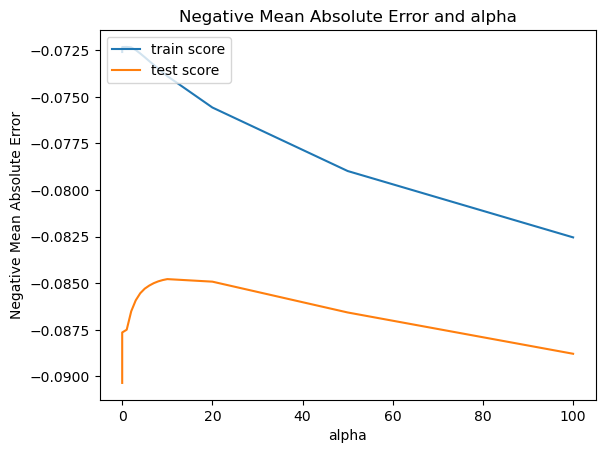

In [121]:
# plotting score of folds
plt.plot(cv_results_ridge['param_alpha'], cv_results_ridge['mean_train_score'])
plt.plot(cv_results_ridge['param_alpha'], cv_results_ridge['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

We can observe that the test score is max at alpha=10 and then its dropping.
Hence the optimum value for alpha is 10 for ridge regression.

In [122]:
#Building ridge regression model with alpha=10
alpha = 10
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
ridge.coef_

array([ 0.00764399,  0.03051308,  0.07174038,  0.06347306, -0.002391  ,
        0.0156292 , -0.01175569,  0.0575328 ,  0.02603332,  0.10895306,
        0.01044247, -0.0006233 ,  0.01476039,  0.01539964,  0.00439293,
       -0.01525206,  0.00780151,  0.04165713,  0.00999797,  0.00417092,
        0.00888716,  0.0055596 ,  0.01199117, -0.00736365, -0.00290373,
       -0.05662477,  0.00709866, -0.06273055, -0.01711095,  0.01406461,
       -0.0047938 , -0.03362393,  0.02805977,  0.01701516,  0.00891408,
        0.00214943,  0.01187044,  0.01182434, -0.04808005,  0.00156965,
        0.0074927 , -0.07427377,  0.00144661, -0.03335297,  0.00322106,
        0.03848561, -0.03005274, -0.00584074, -0.0045977 , -0.00161626,
        0.0453025 ,  0.0066121 ,  0.00664209,  0.09105788, -0.05923869,
       -0.00858372, -0.07891427, -0.05212815, -0.03667436, -0.00844639,
       -0.00205216, -0.0389803 ,  0.02964343,  0.06553521, -0.03741729,
        0.00266541, -0.01538047, -0.02063367,  0.06250258,  0.06

In [124]:
X_train.columns

Index(['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '2ndFlrSF', 'GrLivArea',
       ...
       'MoSold_6', 'MoSold_7', 'MoSold_8', 'MoSold_9', 'MoSold_10',
       'MoSold_11', 'MoSold_12', 'SaleCondition_Normal',
       'SaleCondition_Others', 'SaleCondition_Partial'],
      dtype='object', length=147)

In [123]:
len(ridge.coef_)

147

All the features are considered in Ridge regression and all of them have a non-zero coefficients.

#### Lasso Regression

In [127]:
lasso = Lasso()

# cross validation with 5 k-folds
model_cv_lasso = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv_lasso.fit(X_train, y_train)

Fitting 5 folds for each of 26 candidates, totalling 130 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [128]:
cv_results_lasso = pd.DataFrame(model_cv_lasso.cv_results_)
cv_results_lasso.head(10)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.030431,0.006545,0.007201,1.600933e-03,0.0001,{'alpha': 0.0001},-0.103401,-0.080888,-0.085629,-0.081313,-0.083885,-0.087023,0.008370,2,-0.067562,-0.074171,-0.073165,-0.073433,-0.073721,-0.072411,0.002447
1,0.016309,0.003029,0.003702,5.988634e-04,0.001,{'alpha': 0.001},-0.098321,-0.077091,-0.082431,-0.082428,-0.086604,-0.085375,0.007143,1,-0.072978,-0.079340,-0.078305,-0.078227,-0.077585,-0.077287,0.002227
2,0.013633,0.001985,0.002400,1.959450e-03,0.01,{'alpha': 0.01},-0.104206,-0.085604,-0.091693,-0.095286,-0.095239,-0.094406,0.006039,3,-0.089361,-0.094912,-0.092967,-0.093311,-0.092499,-0.092610,0.001816
3,0.013661,0.002016,0.004799,1.600743e-03,0.05,{'alpha': 0.05},-0.133463,-0.112507,-0.111754,-0.121490,-0.119281,-0.119699,0.007845,4,-0.114564,-0.121576,-0.118364,-0.119066,-0.117407,-0.118195,0.002282
4,0.012009,0.000013,0.004004,5.505353e-06,0.1,{'alpha': 0.1},-0.173186,-0.148969,-0.146512,-0.153951,-0.147321,-0.153988,0.009941,5,-0.149028,-0.155962,-0.154600,-0.151051,-0.152806,-0.152690,0.002468
5,0.012004,0.000007,0.004001,4.422006e-07,0.2,{'alpha': 0.2},-0.245041,-0.224066,-0.229287,-0.209930,-0.224256,-0.226516,0.011288,6,-0.222509,-0.229490,-0.226118,-0.222002,-0.229363,-0.225896,0.003213
6,0.016358,0.000396,0.005409,2.157510e-03,0.3,{'alpha': 0.3},-0.316016,-0.298172,-0.303978,-0.262668,-0.299243,-0.296016,0.017836,7,-0.292876,-0.299386,-0.293448,-0.289223,-0.300899,-0.295166,0.004341
7,0.016002,0.002519,0.005600,1.961786e-03,0.4,{'alpha': 0.4},-0.331103,-0.311116,-0.319966,-0.285585,-0.311168,-0.311788,0.015016,8,-0.306556,-0.311918,-0.308973,-0.318331,-0.312101,-0.311576,0.003950
8,0.015203,0.001603,0.004798,1.600854e-03,0.5,{'alpha': 0.5},-0.331103,-0.311116,-0.319966,-0.285585,-0.311168,-0.311788,0.015016,8,-0.306556,-0.311918,-0.308973,-0.318331,-0.312101,-0.311576,0.003950
9,0.017550,0.002092,0.005598,1.957816e-03,0.6,{'alpha': 0.6},-0.331103,-0.311116,-0.319966,-0.285585,-0.311168,-0.311788,0.015016,8,-0.306556,-0.311918,-0.308973,-0.318331,-0.312101,-0.311576,0.003950


In [130]:
print(model_cv_lasso.best_params_)
print(model_cv_lasso.best_score_)

{'alpha': 0.001}
-0.08537505122450353


After alpha 0.3 the values for score on test data is not changing as per above table.

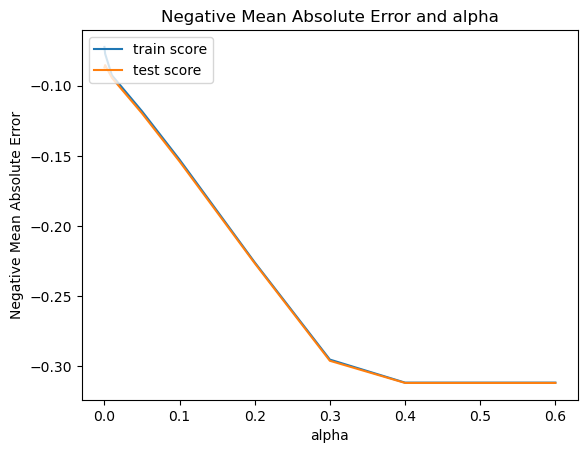

In [131]:
cv_results_lasso['param_alpha'] = cv_results_lasso['param_alpha'].astype('float32')
cv_results_lasso = cv_results_lasso[cv_results_lasso['param_alpha']<=0.6]

# plotting
plt.plot(cv_results_lasso['param_alpha'], cv_results_lasso['mean_train_score'])
plt.plot(cv_results_lasso['param_alpha'], cv_results_lasso['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')

plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [132]:
#Building ridge regression model with alpha=0.001
alpha = 0.001

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train, y_train) 

Lasso(alpha=0.001)

In [133]:
lasso.coef_

array([ 0.00792248,  0.02870748,  0.08490181,  0.06282532, -0.00066302,
        0.02119813, -0.00652088,  0.048851  ,  0.        ,  0.12997691,
        0.01244489, -0.00020492,  0.01033785,  0.01060236,  0.        ,
       -0.01486957,  0.01042506,  0.04524157,  0.00977079,  0.00216808,
        0.00655492,  0.00324734,  0.0107372 , -0.00405455, -0.0025366 ,
       -0.06139944,  0.        , -0.05658692, -0.        ,  0.        ,
       -0.        , -0.01489098,  0.00057072,  0.        ,  0.        ,
       -0.        ,  0.        ,  0.00996759, -0.03332014, -0.        ,
       -0.        , -0.06903387,  0.        , -0.0477322 , -0.        ,
        0.02971121, -0.        , -0.        ,  0.        , -0.        ,
        0.04226642,  0.        ,  0.        ,  0.10370325, -0.04027268,
       -0.        , -0.05373903, -0.        , -0.        ,  0.        ,
       -0.        , -0.02522333,  0.        ,  0.05843931, -0.00448954,
        0.        , -0.        , -0.00304899,  0.04572581,  0.03

We can see that many feature have 0 coefficient in the Lasso refgression model.

### Model Evaluation

In [134]:
# Get predictions on train dataset
y_pred_ridge_train = ridge.predict(X_train)
y_pred_lasso_train = lasso.predict(X_train)

##### Checking for assumption of Linear regeression i.e. error is normally distributed

Error distribution in train dataset


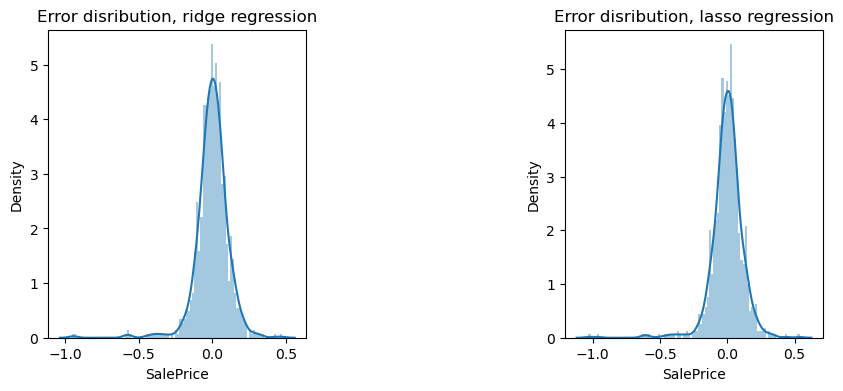

In [136]:
print('Error distribution in train dataset')
plt.figure(figsize=(10,4))
plt.subplot(1, 2, 1)
sns.distplot((y_train - y_pred_ridge_train), bins = 100)
plt.title('Error disribution, ridge regression')

plt.subplot(1, 2, 2)
sns.distplot((y_train - y_pred_lasso_train), bins = 100)
plt.title('Error disribution, lasso regression')

plt.subplots_adjust(wspace = 1)

The error on both ridge and lasso regression seems to be normally distributed with mean centered around 0.

##### Evaluation of model metrics

In [137]:
print('r2_score in train dataset')
print('r2_score for ridge:', r2_score(y_train, y_pred_ridge_train))
print('r2_score for lasso:', r2_score(y_train, y_pred_lasso_train))

r2_score in train dataset
r2_score for ridge: 0.9225672314025584
r2_score for lasso: 0.9135762969120272


##### Evaluation on test data

In [138]:
#using scalar fitted on train dataset to transform numerical columns of test data
X_test[NumColsWOSales] = scaler.transform(X_test[NumColsWOSales])

In [139]:
# Predict target sales price using trained model
y_pred_ridge_test = ridge.predict(X_test)
y_pred_lasso_test = lasso.predict(X_test)

In [140]:
# checking R2 score on test data
print('r2_score in test dataset:')
print('r2_score for ridge:', round(r2_score(y_test, y_pred_ridge_test), 2))
print('r2_score for lasso:', round(r2_score(y_test, y_pred_lasso_test), 2))

r2_score in test dataset:
r2_score for ridge: 0.9
r2_score for lasso: 0.9


We can see that the train r2_score and test r2_score are very close which means we have not overfitted or underfitted the model.

#### Analyzing coefficients for influential factors identification

In [142]:
model_parameter_ridge = list(ridge.coef_)
model_parameter_ridge.insert(0,ridge.intercept_)
cols = X_train.columns
cols.insert(0,'constant')
ridge_coef = pd.DataFrame(list(zip(cols,model_parameter_ridge)))
ridge_coef.columns = ['Feature','Coef']

In [143]:
#Checking positively impacting features in Ridge
ridge_coef.sort_values(by='Coef',ascending=False).head(10)

,Feature,Coef
0,LotFrontage,12.030586
10,BsmtFullBath,0.108953
54,Neighborhood_Edwards,0.091058
3,OverallCond,0.071740
70,Neighborhood_Timber,0.066619
64,Neighborhood_OldTown,0.065535
146,SaleCondition_Partial,0.064638
4,MasVnrArea,0.063473
69,Neighborhood_StoneBr,0.062503
145,SaleCondition_Others,0.060974


In [148]:
#Checking Negatively impacting features in Ridge
ridge_coef.sort_values(by='Coef',ascending=False).tail(10)

,Feature,Coef
62,Neighborhood_NoRidge,-0.038980
117,HeatingQC_Gd,-0.043258
39,MSSubClass_180,-0.048080
58,Neighborhood_Mitchel,-0.052128
84,Exterior1st_Plywood,-0.054792
26,Remodelled,-0.056625
55,Neighborhood_Gilbert,-0.059239
28,MSSubClass_40,-0.062731
42,MSZoning_RL,-0.074274
57,Neighborhood_MeadowV,-0.078914


In [144]:
#lasso model parameters
model_parameters_lasso = list(lasso.coef_)
model_parameters_lasso.insert(0, lasso.intercept_)
cols = X_train.columns
cols.insert(0,'constant')
lasso_coef = pd.DataFrame(list(zip(cols,model_parameters_lasso)))
lasso_coef.columns = ['Feature','Coef']

In [146]:
#Checking positively impacting features in Lasso
lasso_coef.sort_values(by='Coef',ascending=False).head(10)

,Feature,Coef
0,LotFrontage,11.988849
10,BsmtFullBath,0.129977
54,Neighborhood_Edwards,0.103703
3,OverallCond,0.084902
4,MasVnrArea,0.062825
64,Neighborhood_OldTown,0.058439
145,SaleCondition_Others,0.049920
8,2ndFlrSF,0.048851
69,Neighborhood_StoneBr,0.045726
18,WoodDeckSF,0.045242


In [147]:
#Checking negatively impacting features in Lasso
lasso_coef.sort_values(by='Coef',ascending=False).tail(10)

,Feature,Coef
117,HeatingQC_Gd,-0.019379
84,Exterior1st_Plywood,-0.022918
62,Neighborhood_NoRidge,-0.025223
39,MSSubClass_180,-0.033320
55,Neighborhood_Gilbert,-0.040273
44,LotShape_Reg,-0.047732
57,Neighborhood_MeadowV,-0.053739
28,MSSubClass_40,-0.056587
26,Remodelled,-0.061399
42,MSZoning_RL,-0.069034


## Conclusion

As it can be seen from the above weightages on coefficients, below are the top 5 factors which are affecting the sales price of the house

1. LotFrontage
2. BsmtFullBath
3. Neighborhood_Edwards
4. OverallCond
5. MasVnrArea